In [1]:
import numpy as np
import scipy

#from scipy import optimize
from scipy import optimize
from scipy.optimize import minimize as spmin
from scipy.optimize import Bounds

import matplotlib.pyplot as plt
#from decimal import *
from math import pi, sin, cos
#from bigfloat import *
from sympy import *
#print("arrived here")
import functools
#from numdifftools import Jacobian, Hessian
#from sympy.mpmath import *
import timeit
%matplotlib inline

import dlib

import numba

from numba import jit
from numba import njit

from joblib import Parallel, delayed
import multiprocessing

import random


In [161]:

### "prec" is the precision used in numerical solving the minimum of the equations

prec=30

#K1=("{0}.{1}f").format((2.0*10**4),prec)

#K1="%.200f" % (2.0*10**4)

#Ms=float(format(float(1*10**3),(".{}f").format(prec)))
#K1=float(format(float(2*10**6/(Ms**2)),(".{}f").format(prec)))
#K2=float(format(float(1*10**6/(Ms**2)),(".{}f").format(prec))[:200])


dfsol=Symbol("dfsol")
df=Symbol("df")
x=Symbol("x")
y=Symbol("y")
h=Symbol("h")
theta=Symbol("theta")
phi=Symbol("phi")
K1=Symbol("K1")
K2=Symbol("K2")
Ku=Symbol("Ku")
htheta=Symbol("htheta")
hphi=Symbol("hphi")
thetainc=Symbol("thetainc")
sigma=Symbol("sigma")
ebi=Symbol("ebi")
z=Symbol("z")
desp=Symbol("desp")

"""

free_energy=Function("free_energy")
pi=float(3.1415)
Msat=float(600)
Ms=float(1/600)
#Ku=float((2*10**5)/Msat**2)
Ku=float((-0.0*10**6)/Msat**2)

K1=float((-2.8*10**6)/Msat**2)
K2=float((0.0*10**6)/Msat**2)
e0=float(2.5/100)
C11=float(1.2*10**10/Msat**2)
C12=float(0.5*10**10/Msat**2)
htheta=float(+1*pi/2+0.01)
hphi=float(0*pi/2.)

lambda_mf=-0*1.50

sigma=float(4.5*10**8/Msat**2)
ebi=float(1.50/100)
#z=
desp=10
"""

"""

free_energy=Function("free_energy")
pi=float(3.1415)
Msat=float(600)
Ms=float(1/600)
#Ku=float((2*10**5)/Msat**2)
Ku=float((-0.0*10**6)/Msat**2)

K1=float((-4.5*10**6)/Msat**2)
K2=float((0.0*10**6)/Msat**2)
e0=float(1.9/100)
C11=float(1.2*10**10/Msat**2)
C12=float(0.5*10**10/Msat**2)
htheta=float(+1*pi/2+0.01)
hphi=float(1*pi/2.)

lambda_mf=-0*1.50

sigma=float(-6.5*10**8/Msat**2)
ebi=float(1.50/100)
#z=
desp=10

"""

free_energy=Function("free_energy")
pi=float(3.1415)
Msat=float(600)
Ms=float(1/600)
#Ku=float((2*10**5)/Msat**2)
Ku=float((-0.0*10**6)/Msat**2)

K1=float(((2.0)*10**6)/Msat**2)
#K1nrp=float((1*1.0*(-0.5+0.0)*10**6)/Msat**2)
K1nrp=float((-0*(0.5+0.0)*10**4)/Msat**2)
nu=float((-0.0*10**8)/Msat**2)
K2=float((-1*3.5*10**6)/Msat**2)
e0=float(0.70/100)
#C12=float(1.0*10**10/Msat**2)
#C11=float(4.0*10**10/Msat**2)
#C12=float(4.0*10**10/Msat**2)
C11=float(1.6*4.0*10**10/Msat**2)
C12=float(1.6*4.0*10**10/Msat**2)
#b1=float(1.0*6.0*10**13/Msat**2)
#b4=float(1.0*6.0*10**13/Msat**2)
b1=float(1.0*8.0*10**13/Msat**2)
b4=float(1.0*8.0*10**13/Msat**2)
#C12=float(0.7*10**10/Msat**2)
htheta=float(+1*pi/2.)
hphi=float(0*pi/2.)
h_curl=float(0.000)
# angle between the variants!
angle_var1=+pi/4.
angle_var2=+pi/4.+(pi/2-10*pi/180) 

lambda_mf=-0*2*pi/2.

sigma = float(-1.5/2.*1.00*10**8/Msat**2)

#radial gradient

sigmar = float(1.5/2.*1.00*10**8/Msat**2)
sigmary = float(1.5/2.*1.00*10**8/Msat**2)

EE=float(1.2*10**10/Msat**2)

lameff = EE*(3/4)
Geff = EE*(3/8)

J_exc= float((0*(0.2+0.0)*10**6)/Msat**2)

ebi=float(-1.00/100)
#z=
desp=10

# just an initial value for thetainc
thetainc=float(0.)

In [162]:

# applied field parameters

hini=-30000.*2
hfinal=30000.*2
step=1200*2

hpasso=(hfinal-hini)/step



In [163]:
### defining the system anisotropy


#@functools.lru_cache
@jit(nopython=True,parallel=True)
def anisotropy_elastic(phi,theta,K1,K2,h,htheta,hphi,e0,C11,Ku,df,thetainc,sigma,ebi,z,desp):
    anis=0
    epsx=e0*(1/2.-df)*np.sin(theta)*np.sin(phi)*np.cos(thetainc)
    epsy=e0*((1/2.+df)+(1/2.-df)*np.sin(theta)*np.cos(phi))*np.sin(thetainc)
    epsz=-(epsx+epsy)/2.

    anis+=1/2.*C11*(epsx**2+epsy**2+epsz**2)#+C12*(epsx*epsy+epsz*epsy+epsx*epsz)
    return anis



In [164]:

### defining the system anisotropy


#@functools.lru_cache
@jit(nopython=True,parallel=True)
def anisotropy(phi,theta,K1,K2,h,htheta,hphi,e0,C11,Ku,df,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2):
    
    #    anis=K1*(sin(x)**2*cos(x)**2*sin(y)**4+sin(y)**2*cos(y)**2)
#    anis=K1*(1/2-df)*(np.sin(phi-thetainc)**2*np.cos(phi-thetainc)**2*np.sin(theta-z)**4+np.sin(phi-thetainc)**2*np.sin(theta-z)**2*np.cos(theta-z)**2+np.cos(phi-thetainc)**2*np.sin(theta-z)**2*np.cos(theta-z)**2)
#    anis=K1*(1/2-df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta-z)**4+np.sin(phi)**2*np.sin(theta-z)**2*np.cos(theta-z)**2+np.cos(phi)**2*np.sin(theta-z)**2*np.cos(theta-z)**2)
#    anis=K1*(1/2-df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta-thetainc)**4+np.sin(phi)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)
#    anis=K1*(1/2-df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta)**4+np.sin(phi)**2*np.sin(theta)**2*np.cos(theta)**2+np.cos(phi)**2*np.sin(theta)**2*np.cos(theta)**2)
#    anis=K1*(1/2-df)*(np.sin(phi-z)**2*np.cos(phi-z)**2*np.sin(theta-thetainc)**4+np.sin(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)
#    anis=K1*(1/2-df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta)**4+np.sin(phi)**2*np.sin(theta)**2*np.cos(theta)**2+np.cos(phi)**2*np.sin(theta)**2*np.cos(theta)**2)
#    anis=K1*(1/2-df)*(np.sin(phi+angle_var1)**2*np.cos(phi+angle_var1)**2*np.sin(theta)**4+np.sin(phi+angle_var1)**2*np.sin(theta)**2*np.cos(theta)**2+np.cos(phi+angle_var1)**2*np.sin(theta)**2*np.cos(theta)**2)
    anis=K1*(1/2-df)*(np.sin(phi-z+angle_var1)**2*np.cos(phi-z+angle_var1)**2*np.sin(theta-thetainc)**4+np.sin(phi-z+angle_var1)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi-z+angle_var1)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)

    
    
    
#    anis+=K1nrp*(1/2+df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta-thetainc)**4+np.sin(phi)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)
#    anis+=K1nrp*(1/2+df)*(np.sin(phi-z)**2*np.cos(phi-z)**2*np.sin(theta-thetainc)**4+np.sin(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)
    anis+=K1nrp*(1/2+df)*(np.sin(phi)**2*np.cos(phi)**2*np.sin(theta)**4+np.sin(phi)**2*np.sin(theta)**2*np.cos(theta)**2+np.cos(phi)**2*np.sin(theta)**2*np.cos(theta)**2)
    
#    anis+=K2*(1/2-df)*np.sin(phi-thetainc)**2*np.sin(theta-z)**2*np.cos(phi-thetainc)**2*np.sin(theta-z)**2*np.cos(theta-z)**2
#    anis+=K2*(1/2-df)*np.sin(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2
#    anis+=K2*(1/2-df)*np.sin(phi+angle_var1)**2*np.sin(theta)**2*np.cos(phi+angle_var1)**2*np.sin(theta)**2*np.cos(theta)**2
    anis+=K2*(1/2-df)*np.sin(phi-z+angle_var1)**2*np.sin(theta-thetainc)**2*np.cos(phi-z+angle_var1)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2

    
#    anis+=K2*(1/2-df)*np.sin(phi)**4
#    anis=(1/2-df)*Ku*(sin(theta)**2*cos(phi)**2)
#    anis+=(1/2-df)*Ku*(np.cos(theta-thetainc)**2)
    anis+=(1/2-df)*Ku*(np.cos(theta-z)**2)
#    anis+=(1/2-df)*Ku*(np.cos(theta-thetainc)**2)
#    anis+=(1/2-df)*K2*(np.cos(theta-thetainc)**4)


#    anis+=-2*3.1415*((1/2.-df)*(np.sin(theta)))**2

#    anis+=-2*3.1415*(((1/2.+df)+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta))))**2

    # let us add stress anisotropies!!!
#    anis+=-sigma*(ebi*np.cos(thetainc))*(1/2.-df)*(z)
    
#    epsx=e0*(1/2.-df)*np.cos(thetainc)
#    epsy=e0*(1/2.+df)*np.sin(thetainc)
#    epsx_0=e0*(1/2.-df)*np.sin(theta)*np.sin(phi)
#    epsy_0=e0*((1/2.+df)+(1/2.-df)*np.sin(theta)*np.cos(phi))
#    epsz_0=-(epsx_0+epsz_0)/2.
#    epsz_0=e0*(1/2.-df)*np.cos(theta)

#    epsx_0=+e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.cos(phi+angle_var1))#*np.sin(phi-thetainc)
    epsx_0=+(1-thetainc/2/3.1415)*e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.cos(phi+angle_var1))#*np.sin(phi-thetainc)
    epsy_0=+e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.sin(phi+angle_var1))#*np.cos(phi-thetainc))
#    epsy_0=+(1-thetainc/2/3.1415)*e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.sin(phi+angle_var1))#*np.cos(phi-thetainc))
    epsz_0=+e0*((1/2.-df)*np.cos(theta))
#    epsz_0=+(1-thetainc/2/3.1415)*e0*((1/2.-df)*np.cos(theta))
#    epsz_0=-(epsx_0+epsy_0)/2.

#    epsx_0_res = +1*e0*(1*(1/2.+df)*np.sin(theta)*np.cos(phi+angle_var2))#*np.sin(phi-thetainc)
    epsx_0_res = +(1-thetainc/2/3.1415)*e0*(1*(1/2.+df)*np.sin(theta)*np.cos(phi+angle_var2))#*np.sin(phi-thetainc)
    epsy_0_res = +1*e0*(1*(1/2.+df)*np.sin(theta)*np.sin(phi+angle_var2))#*np.cos(phi-thetainc))
#    epsy_0_res = +(1-thetainc/2/3.1415)*e0*(1*(1/2.+df)*np.sin(theta)*np.sin(phi+angle_var2))#*np.cos(phi-thetainc))
    epsz_0_res = 1*e0*((1/2.+df)*np.cos(theta))
#    epsz_0_res = (1-thetainc/2/3.1415)*e0*((1/2.+df)*np.cos(theta))
#    epsz_0_res = -(epsx_0_res+epsy_0_res)/2.
    """
    
    
    epsx_0=+e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.cos(phi))#*np.sin(phi-thetainc)
    epsy_0=+e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta)*np.sin(phi))#*np.cos(phi-thetainc))
    epsz_0=1*(-epsx_0/2.-epsy_0/2.)
#    epsz_0=-2.*e0*((1/2.+df)*0+(1/2.-df)*np.sin(theta))

    epsx_0_res = +1*e0*(1*(1/2.+df)*np.sin(theta)*np.cos(phi))#*np.sin(phi-thetainc)
    epsy_0_res = +1*e0*(1*(1/2.+df)*np.sin(theta)*np.sin(phi))#*np.cos(phi-thetainc))
    epsz_0_res = 1*(-epsx_0_res/2.-epsy_0_res/2.)
#    epsz_0_res=-1/2.*e0*((1/2.+df)*np.sin(theta))
    """
    
    
    
    
    
    
    
    """

    epsx_0=+e0*(+(1/2.-df)*np.sin(theta)*np.cos(phi))#*np.sin(phi-thetainc)
    epsy_0=+e0*((1/2.+df)+(1/2.-df)*np.sin(theta)*np.sin(phi))#*np.cos(phi-thetainc))
    epsz_0=-e0*((1/2.-df)*np.cos(theta))


    epsx_0=+e0*((1/2.-df)*np.sin(theta)*np.cos(phi))#*np.sin(phi-thetainc)
    epsy_0=+e0*((1/2.-df)*np.sin(theta)*np.sin(phi))#*np.cos(phi-thetainc))
    epsz_0=-e0*((1/2.-df)*np.cos(theta))
    """
    
    
#    epsx_0=e0*(1/2.-df)*np.sin(theta)*np.sin(phi)
#    epsy_0=e0*((1/2.+df)+(1/2.-df)*np.sin(theta)*np.cos(phi))
#    epsz_0=e0*(1/2.-df)*np.cos(theta)
#    epsz_0=e0*(+(1/2.-df)*np.cos(theta))
#    epsz_0=e0*(1/2.-df)*np.cos(theta)


    
#    epsx=epsx_0
#    epsy=epsy_0
#    epsz=epsz_0

#    epsz = e0*(+(1/2.-df)*np.cos(theta-z))
#    epsz_0=-(epsx_0+epsy_0)/2.
#    epsz_0=ebi-epsx_0-epsy_0

#    epsx=(+epsx_0*np.cos(thetainc)**2-epsy_0*np.sin(thetainc)**2)/(np.cos(thetainc)**4-np.sin(thetainc)**4)
#    epsy=(-epsx_0*np.sin(thetainc)**2+epsy_0*np.cos(thetainc)**2)/(np.cos(thetainc)**4-np.sin(thetainc)**4)

#    epsx=(+epsx_0*np.cos(thetainc)**2-epsy_0*np.sin(thetainc)**2)
#    epsy=(-epsx_0*np.sin(thetainc)**2+epsy_0*np.cos(thetainc)**2)





    epsx_00=(+epsx_0*np.cos(z)**2+epsy_0*np.sin(z)**2)
    epsy_00=(+epsx_0*np.sin(z)**2+epsy_0*np.cos(z)**2)
    epsz_00=epsz_0
    
    epsx=(+epsx_00*np.cos(thetainc)**2+epsz_00*np.sin(thetainc)**2)
    epsz=(+epsx_00*np.sin(thetainc)**2+epsz_00*np.cos(thetainc)**2)
    epsy=epsy_00

    """
    
    
    epsx_00=(+epsx_0*np.cos(2*z)+epsy_0*np.sin(2*z))
    epsy_00=(+epsy_0*np.cos(2*z)-epsx_0*np.sin(2*z))
    epsz_00=epsz_0



    epsx=(+epsx_00*np.cos(2*thetainc)+epsz_00*np.sin(2*thetainc))
    epsz=(+epsz_00*np.cos(2*thetainc)-epsx_00*np.sin(2*thetainc))
    epsy=epsy_00

    """
    
    
    """
    epsx_00_res=(+epsx_0_res*np.cos(2*z)+epsy_0_res*np.sin(2*z))
    epsy_00_res=(+epsy_0_res*np.cos(2*z)-epsx_0_res*np.sin(2*z))
    epsz_00_res=epsz_0_res



    epsx_res=(+epsx_00_res*np.cos(2*thetainc)+epsz_00_res*np.sin(2*thetainc))
    epsz_res=(+epsz_00_res*np.cos(2*thetainc)-epsx_00_res*np.sin(2*thetainc))
    epsy_res=epsy_00_res
    """

    
    epsx_00_res=(+epsx_0_res*np.cos(z)**2+epsy_0_res*np.sin(z)**2)
    epsy_00_res=(+epsx_0_res*np.sin(z)**2+epsy_0_res*np.cos(z)**2)
    epsz_00_res=epsz_0_res
    
    epsx_res=(+epsx_00_res*np.cos(thetainc)**2+epsz_00_res*np.sin(thetainc)**2)
    epsz_res=(+epsx_00_res*np.sin(thetainc)**2+epsz_00_res*np.cos(thetainc)**2)
    epsy_res=epsy_00_res
    
    
    
    """
    
    
    epsx=epsx_0
    epsy=epsy_0
    epsz=epsz_0
    
    epsx_res=epsx_0_res
    epsy_res=epsy_0_res
    epsz_res=epsz_0_res
    
    """

    
#     epsx=ebi
#     epsy=ebi
 
#    sigmax=(sigmar*np.cos(thetainc)**2-sigmary*np.sin(thetainc)**2)/(np.cos(thetainc)**4-np.sin(thetainc)**4)
#    sigmay=(-sigmar*np.sin(thetainc)**2+sigmary*np.cos(thetainc)**2)/(np.cos(thetainc)**4-np.sin(thetainc)**4)
#    sigmax=(sigmar*np.cos(2*thetainc)+sigmary*np.sin(2*thetainc))
#    sigmay=(sigmary*np.cos(2*thetainc)-sigmar*np.sin(2*thetainc))
    sigmax=sigmar
    sigmay=sigmary

#    epsx=epsx_0*np.cos(thetainc)**2+epsy_0*np.sin(thetainc)**2

#    epsy=epsx_0*np.sin(thetainc)**2+epsy_0*np.cos(thetainc)**2
#    sigmax=sigmar*np.cos(thetainc)**2+sigmary*np.sin(thetainc)**2
#    sigmay=sigmar*np.sin(thetainc)**2+sigmary*np.cos(thetainc)**2
    
#    epsz = ebi
   
#    epsz = epsz_0
#    epsz=ebi-epsx-epsy
#    epsz=-(epsx+epsy)/2.
#    epsz=-(epsx_0+epsy_0)/2



    """
    """

    # transforming the stress!
    sigmax_00=(+sigmax*np.cos(z)**2+sigmay*np.sin(z)**2)
    sigmay_00=(+sigmax*np.sin(z)**2+sigmay*np.cos(z)**2)
    sigmaz_00=sigma
    
    sigmax=(+sigmax_00*np.cos(thetainc)**2+sigmaz_00*np.sin(thetainc)**2)
    sigma=(+sigmax_00*np.sin(thetainc)**2+sigmaz_00*np.cos(thetainc)**2)
    sigmay=sigmay_00



    u1=(epsx+epsy+epsz)/3.    
    u2=1.71*(epsx-epsy)
    u3=2*epsz-epsx-epsy

    u1_res=(epsx_res+epsy_res+epsz_res)/3.    
    u2_res=1.71*(epsx_res-epsy_res)
    u3_res=2*epsz_res-epsx_res-epsy_res

    
    
    #    epsz=-(epsx+epsy)/2.

    '''
    u1=epsx    
    u2=epsy
    u3=epsz
    '''

    sigma1= sigmax*r
    sigma3= sigma*r2
    sigma2= sigmay*z3
    
    
    '''
    sigma1= sigmax*r
    sigma2= sigmay*r2
    sigma3= sigma*z3

    sigma1= (sigma*z+sigmax*r+sigmay*r)/3
    sigma2=1.71*(sigmax*r-sigmay*r)
    sigma3=2*sigma*z-sigmax*r-sigmay*r
    '''
    epsvol=(epsx+epsy+epsz)/3.

#    anis+=-1/6*(sigma3*(u3)*(1/2.-df)+sigma2*(u2)*(1/2.-df))
#    anis+=-3*sigma1*u1*(1/2.-df)
    '''
    anis+=-sigma3*(u3)-sigma2*(u2)
    anis+=-sigma1*u1
    '''
    
    sigma1_new=(sigma1+sigma2+sigma3)/3.
    sigma2_new=1.71*(sigma1-sigma2)
    sigma3_new=2.*sigma3-sigma1-sigma2
    
    
    anis+=-sigma3_new*(u3)/6.-sigma2_new*(u2)/6.
    anis+=-3*sigma1_new*u1
    

    anis+=-sigma3_new*(u3_res)/6.-sigma2_new*(u2_res)/6.
    anis+=-3*sigma1_new*u1_res

    #    anis+=-sigma*(u3)*(1/2.-df)*(z)
    
    #anis+=-sigmar*(u2)*(1/2.-df)*(r)
    
#    anis+=-(sigmar*(r)-lameff*epsvol*3)/(2*Geff)*(1/2.-df)*(r)*sigmar
    
    anis+=-J_exc*(epsx+epsy)*np.cos(theta+0.01)
    
#    anis+=1/2.*C11*(epsx**2+epsy**2+epsz**2)#+C12*(epsx*epsy+epsz*epsy+epsx*epsz)
    anis+=1/2.*C11*(u1**2)+1/2*C12*(u2**2+u3**2)+b1*(u1**4)+b4*(u2**2+u3**2)**2

    
    anis+=1/2.*C11*(u1_res**2)+1/2*C12*(u2_res**2+u3_res**2)+b1*(u1_res**4)+b4*(u2_res**2+u3_res**2)**2
    
#    anis+= 1/2.*C11*(e0*(1/2.+df))**2+b1*(e0*(1/2.+df))**4
    #+C12*(epsx*epsy+epsz*epsy+epsx*epsz)
    anis+=((epsx+epsy+epsz)*nu)*(1/2-df)*(np.sin(phi-z)**2*np.cos(phi-z)**2*np.sin(theta-thetainc)**4+np.sin(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2+np.cos(phi-z)**2*np.sin(theta-thetainc)**2*np.cos(theta-thetainc)**2)
    
    return anis


In [165]:

#@functools.lru_cache
@jit(nopython=True,parallel=True)
def zeeman_energy(phi,theta,K1,K2,h,htheta,hphi,e0,C11,Ku,df,zmar,thetaincmar):
#    zeeman=-h*(sin(htheta)*sin(theta)*cos(phi-hphi)+cos(htheta)*cos(theta))
#    zeeman=-h*((1/2.+df)+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi+3.1415/2.)+np.cos(htheta)*np.cos(theta))+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta+3.1415/2.)*np.sin(theta)*np.cos(phi-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(theta))+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(theta-0.94)*np.cos(phi-hphi+3.1415/4.)+np.cos(htheta)*np.cos(theta-0.94))+(1/2.-df)*(np.sin(htheta)*np.sin(theta-3.14/2.)*np.cos(phi-hphi+3.14/2.)+np.cos(htheta)*np.cos(theta-3.14/2.)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta-thetaincmar)*np.sin(theta)*np.cos(phi-hphi+1*3.1415/2.+zmar)+np.cos(htheta-thetaincmar)*np.cos(theta))+(1/2.-df)*(np.sin(htheta-thetaincmar)*np.sin(theta)*np.cos(phi-hphi+zmar)+np.cos(htheta-thetaincmar)*np.cos(theta)))

#    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi+3.1415/2.)+np.cos(htheta)*np.cos(theta))+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))

#    zeeman=-h*((1/2.+df)+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*(1*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi)+np.cos(htheta)*np.cos(theta)))
#    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi+angle_var2)+np.cos(htheta)*np.cos(theta))+(1/2.-df)*(np.sin(htheta)*np.sin(theta)*np.cos(phi-hphi+angle_var1)+np.cos(htheta)*np.cos(theta)))
    zeeman=-h*((1/2.+df)*(np.sin(htheta)*np.sin(theta-thetaincmar)*np.cos(phi-hphi+angle_var2-zmar)+np.cos(htheta)*np.cos(theta-thetaincmar))+(1/2.-df)*(np.sin(htheta)*np.sin(theta-thetaincmar)*np.cos(phi-hphi+angle_var1-zmar)+np.cos(htheta)*np.cos(theta-thetaincmar)))


    return zeeman
    




In [166]:

#@jit(nopython=True,parallel=True)
def free_energyhighfield(xx,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,phi,theta,sigmar,r,K1nrp,r2):
#    anis=K1*(sin(x[0])**2*cos(x[0])**2*sin(x[1])**4+sin(x[1])**2*cos(x[1])**2)
#    xx=np.array(xx)
#    anis=anisotropy(x,y,K1,K2,h,htheta,hphi).subs({x:xx[0],y:xx[1]})
    anis=anisotropy(phi,theta,K1,K2,h,htheta,hphi,e0,C11,Ku,xx[0],thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2)
#    print(anis,"ahhhh",x[0])
#    zeeman=-h*(sin(htheta)*sin(x[1])*cos(x[0]-hphi)+cos(htheta)*cos(x[1]))
#    zeeman=zeeman_energy(x,y,K1,K2,h,htheta,hphi).subs({x:xx[0],y:xx[1]})
    zeeman=zeeman_energy(phi,theta,K1,K2,h,htheta,hphi,e0,C11,Ku,xx[0],zmar,thetaincmar)
#    print(zeeman,"ahhhh",x[0])

    expr_calc=anis+zeeman

#    anisderiv=diff(anis,x[0])

    return np.array(expr_calc,dtype=np.float64)






In [167]:
h=0
z=0
z3=0
thetainc=2
zmar=0
thetaincmar=2
r2=1

bbb=free_energyhighfield([0],K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,0,0.,1,2,K1nrp,r2)

print(bbb)


8.168643302882522


In [168]:

@jit(nopython=True,parallel=True)
def free_energy(xx,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar):
#def free_energy(xx,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,zmar,thetaincmar):

    
#    anis=K1*(sin(x[0])**2*cos(x[0])**2*sin(x[1])**4+sin(x[1])**2*cos(x[1])**2)
#    xx=np.array(xx)
#    anis=anisotropy(x,y,K1,K2,h,htheta,hphi).subs({x:xx[0],y:xx[1]})
    anis=anisotropy(xx[0],xx[1],K1,K2,h,htheta,hphi,e0,C11,Ku,xx[2],thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2)
#    print(anis,"ahhhh",x[0])
#    zeeman=-h*(sin(htheta)*sin(x[1])*cos(x[0]-hphi)+cos(htheta)*cos(x[1]))
#    zeeman=zeeman_energy(x,y,K1,K2,h,htheta,hphi).subs({x:xx[0],y:xx[1]})
    zeeman=zeeman_energy(xx[0],xx[1],K1,K2,h,htheta,hphi,e0,C11,Ku,xx[2],zmar,thetaincmar)
#    print(zeeman,"ahhhh",x[0])

    expr_calc=anis+zeeman

#    anisderiv=diff(anis,x[0])

    return np.array(expr_calc,dtype=np.float64)



In [169]:
h=0
z=0
z3=0
thetainc=2
zmar=0
thetaincmar=2
r=0
r2=1
a=free_energy(np.array([0,0,0],dtype=np.float64),K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,0,z3,r2,zmar,thetaincmar)
print(a)

5.994099635957247


In [170]:
# the Free Energy Density's Gradient! 

@jit(nopython=True,parallel=True)
def gradient_freeenergy(xx,K1,K2,h,htheta,hphi,e0,C11,Ku,sigma,ebi,z,desp):
#    anis=K1*(sin(x)**2*cos(x)**2*sin(y)**4+sin(y)**2*cos(y)**2)
#    zeeman=-h*(sin(htheta)*sin(y)*cos(x-hphi)+cos(htheta)*cos(y))
#    xx=np.array(xx)
#    print("aaaa",type(x),type(y))
    anis = anisotropy(x,y,K1,K2,h,htheta,hphi,e0,C11,Ku,df,thetainc,sigma,ebi,z,desp,z3)
    zeeman = zeeman_energy(x,y,K1,K2,h,htheta,hphi,e0,C11,Ku,df,z)
    grad_f_x=diff(anis+zeeman,x)
    grad_f_y=diff(anis+zeeman,y)
    grad_f_df=diff(anis+zeeman,df)

    
    
#    return [grad_f_x.subs({x:vec[0],y:vec[1]}),grad_f_y.subs({x:vec[0],y:vec[1]})]


#    return np.array([grad_f_x.subs({x:xx[0],y:xx[1]}),grad_f_y.subs({x:xx[0],y:xx[1]})],dtype="float")
    return np.array([grad_f_x.subs({x:xx[0],y:xx[1],df:xx[2]}),grad_f_y.subs({x:xx[0],y:xx[1],df:xx[2]}),grad_f_df.subs({x:xx[0],y:xx[1],df:xx[2]})],dtype="float")



#    return [grad_f_x,grad_f_y]
# applied field angles



In [171]:
K1nrp
sigma
results[0][52]

[[[-0.21585051658405513, -0.3895461397015189, 0.8699706270256083],
  [0.15461969106091003, -0.4374391015349845, 0.8858553965430782],
  [-0.1670555503343473, -0.20861266356399744, 0.9167227050304656],
  [0.09463227730440403, -0.08311316077438902, -0.984101032962851],
  [-0.3003114254276294, -0.3931670131144815, -0.865508832491696]],
 [[-0.21585051658405513, -0.3895461397015189, 0.8699706270256083],
  [0.15461969106091003, -0.4374391015349845, 0.8858553965430782],
  [-0.1670555503343473, -0.20861266356399744, 0.9167227050304656],
  [0.09463227730440403, -0.08311316077438902, -0.984101032962851],
  [-0.3003114254276294, -0.3931670131144815, -0.865508832491696]],
 [[-0.21585051658405513, -0.3895461397015189, 0.8699706270256083],
  [0.15461969106091003, -0.4374391015349845, 0.8858553965430782],
  [-0.1670555503343473, -0.20861266356399744, 0.9167227050304656],
  [0.09463227730440403, -0.08311316077438902, -0.984101032962851],
  [-0.3003114254276294, -0.3931670131144815, -0.865508832491696]]

In [172]:

#def hessian_freeenergy(vec,x,y,K1,K2,h,htheta,hphi):
def hessian_freeenergy(xx,K1,K2,h,htheta,hphi,e0,C11,Ku,sigma,ebi,z,desp):
#    anis=K1*(sin(x)**2*cos(x)**2*sin(y)**4+sin(y)**2*cos(y)**2)
#    zeeman=-h*(sin(htheta)*sin(y)*cos(x-hphi)+cos(htheta)*cos(y))
    anis = anisotropy(x,y,K1,K2,h,htheta,hphi,e0,C11,Ku,df,thetainc,sigma,ebi,z,desp,z3)
    zeeman = zeeman_energy(x,y,K1,K2,h,htheta,hphi,e0,C11,Ku,df,z)
    diffsec_f_phi=diff(anis+zeeman,x,2).subs({x:xx[0],y:xx[1]})
    diffsec_f_theta=diff(anis+zeeman,y,2).subs({x:xx[0],y:xx[1]})
    diffsec_f_thetaphi=diff(anis+zeeman,x,y).subs({x:xx[0],y:xx[1]})
#    return diffsec_f_phi*diffsec_f_theta-diffsec_f_thetaphi**2
    return np.array([[diffsec_f_theta,diffsec_f_thetaphi],[diffsec_f_thetaphi,diffsec_f_phi]],dtype="float")



In [173]:

#@jit(object=True)
#def hysteresis_inside(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,k,sigma,ebi,z,desp):
def hysteresis_inside(ndivt,K1,K2,htheta,hphi,e0,C11,Ku,thetainc,kk,sigma,ebi,z,desp,ndivz,ndivr,sigmar,r,K1nrp):

#    z=-1+2*kk/ndivz
#    z= 1*3.14*kk/ndivz

    z3 = 1#-2*(kk/ndivz)**2
    e_0_ini=e0
    hnow=hini/Msat
    maglist=[]
    hlist=[]
    maglistneg=[]
    hlistneg=[]

    #        maglist=np.empty([2,step],dtype=np.float64)
    #        hlist=np.empty([1,step],dtype=np.float64)
    #        maglistneg=np.empty([2,step],dtype=np.float64)
    #        hlistneg=np.empty([1,step],dtype=np.float64)


    maglistend=[]
    hlistend=[]
    maglistnegend=[]
    hlistnegend=[]
    hystlist=[]
    hystlist2=[]
    magstriclist=[]
    magstriclist2=[]
    magstriclist_ur=[]
    magstriclist2_ur=[]
    magstriclisty=[]
    magstriclist2y=[]
    magstriclist_ury=[]
    magstriclist2_ury=[]
    
    magstriclistx=[]
    magstriclist2x=[]
    magstriclist_urx=[]
    magstriclist2_urx=[]

    mxlist=[]
    mylist=[]
    mzzlist=[]
    
    mxlist_ur=[]
    mylist_ur=[]
    mzzlist_ur=[]
    
    mxlist_total=[]
    mylist_total=[]
    mzzlist_total=[]
    
    magstric_r=[]
    magstric_theta=[]
    magstric_z=[]
    
    
    listtheta_reman=[]
    listphi_reman=[]
    listepsx_reman=[]
    listepsy_reman=[]
    listepsz_reman=[]

    
    
    listtheta_reman_volta=[]
    listphi_reman_volta=[]
    listepsx_reman_volta=[]
    listepsy_reman_volta=[]
    listepsz_reman_volta=[]
    

    listtheta_reman_fatia=[]
    listphi_reman_fatia=[]
    listepsx_reman_fatia=[]
    listepsy_reman_fatia=[]
    listepsz_reman_fatia=[]

    list_theta_pi_4_total = []
    list_theta_pim_4_total = []
    list_theta_pi_2_total = []        
    
    list_strain_pi_4_total = []
    list_strain_pim_4_total = []
    list_strain_pi_2_total = []        
    
    # difference in energy zeeman in the twin boundaries
    # this is the stress!

    list_stress_twin_total =[]
    
    for ll in range(ndivt+1):
#        thetainc=ll*2*3.1415/ndivt
    
        hnow=hini/Msat
        maglist=[]
        hlist=[]
        maglistneg=[]
        hlistneg=[]
        elas_energy_list= []
        zee_energy_list = []
        maglistzz=[]
        maglistend0=[]
        
#        thetainc =  1*3.1415/4+0*random.uniform(-1*3.1415/4,3*3.1415/4)
#        thetainc = + 1*3.1415/4+1*random.uniform(-1*3.1415/4,7*3.1415/4)


#        z = 1*3.1415/4 + 1*random.uniform(-1*3.1415/4,7*3.1415/4)
#        z = ll*2*3.1415/ndivt

        listtheta_reman_fatia_partes=[]
        listphi_reman_fatia_partes=[]
        listepsx_reman_fatia_partes=[]
        listepsy_reman_fatia_partes=[]
        listepsz_reman_fatia_partes=[]
        
        list_theta_pi_4 = []
        list_theta_pim_4 = []
        list_theta_pi_2 = []        
        
        list_strain_pi_4 = []
        list_strain_pim_4 = []
        list_strain_pi_2 = []        
        
        for rr in range(ndivr+1):

#            r=1-(1*rr/ndivr)**2
            r=1#-(1*rr/ndivr)**2
            r2=1#-(2*rr/ndivr)**2
#            r=1*rr/ndivr
            
#            thetainc = + 1*3.1415/4+1*random.uniform(-1*3.1415/4,7*3.1415/4)
#            thetainc = random.choice([-3.1415/4,3.1415/4,3.1415/2]) + rr*2*3.1415/ndivr
#            thetainc = random.choice([-3.1415/4,3.1415/4,3.1415/2])


            # film
            if(rr%3==0):
                thetainc = 3.1415/4
            elif(rr%3==1):
                thetainc = -3.1415/4
            elif(rr%3==2):
                thetainc = 3.1415/2
            '''

            # rolled nanomembrane
            if(rr%3==0):
                thetainc = 3.1415/4+ rr*2*3.1415/ndivr
            elif(rr%3==1):
                thetainc = -3.1415/4+ rr*2*3.1415/ndivr
            elif(rr%3==2):
                thetainc = 3.1415/2+ rr*2*3.1415/ndivr
                
            '''
    
    
#            thetainc = rr*2*3.1415/ndivr
#            thetainc = 3.1415/4.
        
            thetaincmar =htheta+0*3.1415/2+0*random.uniform(-0*3.1415/2,1*3.1415/2)
            zmar = hphi + 0*3.1415/4 + 0*random.uniform(0*3.1415/2,1*3.1415/2)
            
            
            z = 1*3.1415/4 + 1*random.uniform(-1*3.1415/4,7*3.1415/4)
            

#            thetainc = + 1*3.1415/4+1*random.uniform(-1*3.1415/4,1*3.1415/4)
    #            thetainc = + 0*3.1415/4+0*random.uniform(-1*3.1415/4,3*3.1415/4)
#            z = rr*2*3.1415/ndivr
#            z = 1*3.1415/4 + 1*random.uniform(-1*3.1415/4,7*3.1415/4)
#            z = 0*3.1415/4 + 1*random.choice([0*3.1415/3,2*3.1415/3,4*3.1415/3])
#            z = 0 


            zmar=z
            thetaincmar=thetainc
    
#            e0=e_0_ini/(rr+1)
    
            """
            thetainc =htheta + 0*3.1415/2+0*random.uniform(-1*3.1415/2,1*3.1415/2)
            z = 0*3.1415/4 + 1*random.choice([-2*3.1415/3,2*3.1415/3,2*3.1415/3])
            """
            
            
#            z= 2*3.1415/3.
#            zmar = z

            hnow=hini/Msat
            maglist=[]
            hlist=[]
            maglistneg=[]
            hlistneg=[]
            elas_energy_list= []
            zee_energy_list = []

            list_stress_twin =[]
                       
            for i in range(1,int(step+1)):
            #for i in range(1,20):
            #for i in range(1,282):

                if(i==1):
                    
                    angx=hphi#+np.pi
                    angy=htheta#+np.pi
                    dfsol=-1/2.
                    """
                    angx=random.uniform(0,2*3.1415)
                    angy=random.uniform(0,3.1415)
                    dfsol=random.uniform(-1/2,1/2)
                    """

                    '''
                    angx=2*3.14*random.random()
                    angy=2*3.14*random.random()#+np.pi
                    dfsol=-1/2+random.random()
                    '''
#                    hnow=0
                    h=hnow+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
        #            free_energyhighfield(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,angx,angy,df)
        #            partialfree=functools.partial(free_energyhighfield,phi=angx)
        #            partialfree2=functools.partial(partialfree,theta=angy)
        #            x0=np.array([angx,angy,angx],dtype=np.float64)
        #            x0=np.array([dfsol],dtype=np.float64)
                    """
                    x0=[0]

                    minxy=spmin(free_energyhighfield,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,angx,angy,sigmar,r,K1nrp),bounds=[[-1/2,1/2]])
        #            minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp),bounds=[[-2*3.1415,2*3.1415],[-2*3.1415,2*3.1415],[-1/2,1/2]],options={'ftol': 1e-90})



                    dfsol=minxy.x[0]
                    dfsolini=dfsol
                    print(dfsol)
                    """
        #            minxybrute=optimize.brute(partialfree,ranges=[slice(-1/2., 1/2., 0.1)],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp))

                    x0=np.array([angx,angy,dfsol],dtype=np.float64)
#                    minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp),bounds=[[-10*3.1415,10*3.1415],[-10*3.1415,10*3.1415],[-1/2,1/2]],options={'ftol': 1e-30})
                    minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})

                    angx=minxy.x[0]
                    angy=minxy.x[1]
                    dfsol=minxy.x[2]


                
#                    maglist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi-3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    maglist.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                    maglist.append(((1/2.+dfsol)*(np.sin(htheta-3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta-3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    maglist.append((1*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                    maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))
                
                
        #            dfsol=minxy.x[2]
                    minxy=0

        #        minxybrute=optimize.brute(free_energy,ranges=(slice(-2*3.1415, 2*3.1415, 0.1),slice(-2*3.1415, 2*3.1415, 0.1),slice(-1/2., 1/2., 0.1)),args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta+3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi-3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-3.14/2.)*np.sin(angy)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta-3.14/2.)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-0.94)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta)*np.cos(angy-0.94))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-3.14/2.)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta)*np.cos(angy-3.14/2.))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+2*3.1415/3.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta-3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta-3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append((1*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                    hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))

    
    
        
        
    
                    magstriclist.append(e0*(1/2.-dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))
                    magstriclist_ur.append(e0*(1/2.+dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))

                    magstriclisty.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx)))
                    magstriclist_ury.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.sin(angx)))
                
                
                    magstriclistx.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx)))
                    magstriclist_urx.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.cos(angx)))

                    mxlist.append((1/2.-dfsol)*(+np.sin(angy)*np.cos(angx)))
                    mylist.append((1/2.-dfsol)*(+np.sin(angy)*np.sin(angx)))
                    mzzlist.append((1/2.-dfsol)*(+np.cos(angy)))
                
                    mxlist_ur.append((1/2.+dfsol)*(+np.sin(angy)*np.cos(angx)))
                    mylist_ur.append((1/2.+dfsol)*(+np.sin(angy)*np.sin(angx)))
                    mzzlist_ur.append((1/2.+dfsol)*(+np.cos(angy)))
                    
#                    mxlist_total.append((+np.sin(angy)*np.cos(angx)))
#                    mylist_total.append((+np.sin(angy)*np.sin(angx)))
                    mxlist_total.append((1/2.+dfsol)*np.sin(angy)*np.cos(angx-3.1415/2.)+(1/2.-dfsol)*np.sin(angy)*np.cos(angx))
                    mylist_total.append((1/2.+dfsol)*np.sin(angy)*np.sin(angx-3.1415/2.)+(1/2.-dfsol)*np.sin(angy)*np.sin(angx))                   
                    mzzlist_total.append((+np.cos(angy)))
                    
                
                
                
                
                    """
                    epsx_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx))
                    epsy_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx))
                    epsz_0=e0*(1/2.-dfsol)*(+np.cos(angy))
                    """
                    epsx_0=e0*(1)*(+np.sin(angy)*np.cos(angx+angle_var1))
                    epsy_0=e0*(1)*(+np.sin(angy)*np.sin(angx+angle_var1))
                    epsz_0=e0*(1)*(+np.cos(angy))

                    
                
                    epsx_00=(+epsx_0*np.cos(z)**2+epsy_0*np.sin(z)**2)
                    epsy_00=(epsx_0*np.sin(z)**2+epsy_0*np.cos(z)**2)
                    epsz_00=epsz_0
    
                    epsx=(+epsx_00*np.cos(thetainc)**2+epsz_00*np.sin(thetainc)**2)
                    epsz=(+epsx_00*np.sin(thetainc)**2+epsz_00*np.cos(thetainc)**2)
                    epsy=epsy_00
                    
                    
                    magstric_r.append(epsx)
                    magstric_theta.append(epsy)
                    magstric_z.append(epsz)

                    
                    list_stress_twin.append(-hnow*((-(1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy)))))
                
                
                if(i!=1 and i<=step/4):

                    if(i!=1):

                #            x0=np.array([angx,angy,dfsol],dtype="float")
                        x0=np.array([angx,angy,dfsol],dtype=np.float64)

                            #        x0=[angx,angy]
                    #        x0=x01.astype(x)
                    #        print(type(x0),x0,type(angx))
                        h=hnow+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
#                        h=hnow+lambda_mf#*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
#                        h=hnow+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                    #		print(minxy)
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),bounds=((0,2*pi),(0,pi)),tol=1*10**-(prec))
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi))
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",jac=gradient_freeenergy,args=(K1,K2,hnow,htheta,hphi),options={'xtol': 1e-80, 'disp': False})
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),options={'xtol': 1e-80, 'disp': False})




            #                minxy=optimize.minimize(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc))
                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],options={'ftol': 1e-30})


                #            minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),jac=gradient_freeenergy,options={'xtol': 1e-8, 'disp': False})

                #            minxy=optimize.minimize(free_energy,[x0],method='nelder-mead',args=(K1,K2,h,htheta,hphi,e0,C11,Ku))



                    #		minxy=optimize.minimize(free_energy,[2,-1],method="CG")
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG",options={"gtol": 1e-120})
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG")
                    #		print(i,"iii")
                    #		print(type(K1),type(minxy.x[0]))
                    #		print(K1+float(minxy.x[0]))
                    #		print(minxy.x[0],float(minxy.x[1]))

                    #		angx=float(minxy.x[0])
                    #		angy=float(minxy.x[1])
                    #		print(minxy.x[1],"minnn")

                        angx=minxy.x[0]
                        angy=minxy.x[1]
                        dfsol=minxy.x[2]


            #                angx=0
            #                angy=0
            #                dfsol=0

                            #		print(dfsol,hnow)
                    #		print(x01,"aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa")

                    #		if(i==step/2):
                    #			angx=angx-pi


                    if(i!=1):

                        #######################################################################################
#######################################################################################
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta+3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi-3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-3.14/2.)*np.sin(angy)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta-3.14/2.)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-0.94)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta)*np.cos(angy-0.94))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-3.14/2.)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta)*np.cos(angy-3.14/2.))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+2*3.1415/3.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta-3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append((1*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))



                        hlist.append(hnow*Msat)
                        maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        hlistneg.append(-hnow*Msat)
                        
                        
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta+3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi-3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-3.14/2.)*np.sin(angy)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta-3.14/2.)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-0.94)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta)*np.cos(angy-0.94))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-3.14/2.)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta)*np.cos(angy-3.14/2.))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+2*3.1415/3.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta-3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta-3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append((1*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                        hystlist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))



                        magstriclist.append(e0*(1/2.-dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))
                        magstriclist_ur.append(e0*(1/2.+dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))
        
                        magstriclisty.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx)))
                        magstriclist_ury.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.sin(angx)))
                

                        magstriclistx.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx)))
                        magstriclist_urx.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.cos(angx)))
                        
                        
                        
                       
                        mxlist.append((1/2.-dfsol)*(+np.sin(angy)*np.cos(angx)))
                        mylist.append((1/2.-dfsol)*(+np.sin(angy)*np.sin(angx)))
                        mzzlist.append((1/2.-dfsol)*(+np.cos(angy)))
                        
                        
                        mxlist_ur.append((1/2.+dfsol)*(+np.sin(angy)*np.cos(angx)))
                        mylist_ur.append((1/2.+dfsol)*(+np.sin(angy)*np.sin(angx)))
                        mzzlist_ur.append((1/2.+dfsol)*(+np.cos(angy)))
                        
#((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        
                        
                        mxlist_total.append((1/2.+dfsol)*np.sin(angy)*np.cos(angx-3.1415/2.)+(1/2.-dfsol)*np.sin(angy)*np.cos(angx))
                        mylist_total.append((1/2.+dfsol)*np.sin(angy)*np.sin(angx-3.1415/2.)+(1/2.-dfsol)*np.sin(angy)*np.sin(angx))
                        mzzlist_total.append((+np.cos(angy)))
                        
                        
                        
                        
                        """
                        epsx_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx))
                        epsy_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx))
                        epsz_0=e0*(1/2.-dfsol)*(+np.cos(angy))
#                        epsz_0=-(epsx_0+epsy_0)/2.
                        """
                        epsx_0=e0*(+np.sin(angy)*np.cos(angx+angle_var1))
                        epsy_0=e0*(+np.sin(angy)*np.sin(angx+angle_var1))
                        epsz_0=e0*(+np.cos(angy))
#                        epsz_0=-(epsx_0+epsy_0)/2.
                    
                        epsx_00=(+epsx_0*np.cos(z)**2+epsy_0*np.sin(z)**2)
                        epsy_00=(+epsx_0*np.sin(z)**2+epsy_0*np.cos(z)**2)
                        epsz_00=epsz_0
    
                        epsx=(+epsx_00*np.cos(thetainc)**2+epsz_00*np.sin(thetainc)**2)
                        epsz=(+epsx_00*np.sin(thetainc)**2+epsz_00*np.cos(thetainc)**2)
                        epsy=epsy_00
                    
                    
                        magstric_r.append(epsx)
                        magstric_theta.append(epsy)
                        magstric_z.append(epsz)
                        
                        h_stop=h_curl/Msat
                        
                        if((hnow>=h_stop and hnow+4*hpasso/Msat<h_stop) or (hnow<=h_stop and hnow+4*hpasso/Msat>h_stop)):
                            listtheta_reman.append(thetainc)
                            listphi_reman.append(z)
                            listepsx_reman.append(epsx)
                            listepsy_reman.append(epsy)
                            listepsz_reman.append(epsz)                           
                                                        
                            
                            listtheta_reman_fatia_partes.append(thetainc)
                            listphi_reman_fatia_partes.append(z)
                            listepsx_reman_fatia_partes.append(epsx)
                            listepsy_reman_fatia_partes.append(epsy)
                            listepsz_reman_fatia_partes.append(epsz)

                            #
                            if(rr%3==0):
                                list_theta_pi_4.append([(1/2.+dfsol)*np.sin(angy-thetainc)*np.cos(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.cos(angx-angle_var1-z),(1/2.+dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var1-z),(1/2.+dfsol)*np.cos(angy-thetainc)+(1/2.-dfsol)*np.cos(angy-thetainc)])
                                list_strain_pi_4.append([epsx,epsy,epsz])
#                                list_theta_pi_4.append(thetainc)
                            elif(rr%3==1):
                                list_theta_pim_4.append([(1/2.+dfsol)*np.sin(angy-thetainc)*np.cos(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.cos(angx-angle_var1-z),(1/2.+dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var1-z),(1/2.+dfsol)*np.cos(angy-thetainc)+(1/2.-dfsol)*np.cos(angy-thetainc)])
                                list_strain_pim_4.append([epsx,epsy,epsz])
                            elif(rr%3==2):
                                list_theta_pi_2.append([(1/2.+dfsol)*np.sin(angy-thetainc)*np.cos(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.cos(angx-angle_var1-z),(1/2.+dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var2-z)+(1/2.-dfsol)*np.sin(angy-thetainc)*np.sin(angx+angle_var1-z),(1/2.+dfsol)*np.cos(angy-thetainc)+(1/2.-dfsol)*np.cos(angy-thetainc)])
                                list_strain_pi_2.append([epsx,epsy,epsz])

                            
                            
#                       list_theta_pi_4,list_theta_pim_4,list_theta_pi_2
                            
                            
                            
                        list_stress_twin.append(-hnow*((-(1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy)))))

                            
                        #######################################################################################
#######################################################################################

#                        hnow=hnow+2*hpasso/Msat
#                        hnow=hnow+2*hpasso/Msat
                        hnow=hnow+4*hpasso/Msat
    
        #                maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
        #                hlist.append(hnow*Msat)
        #                maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
        #                hlistneg.append(-hnow*Msat)



                elif(i>=step/4 and i<=step/2):


                    if(i!=1):

                #            x0=np.array([angx,angy,dfsol],dtype="float")
                        x0=np.array([angx,angy,dfsol],dtype=np.float64)

                            #        x0=[angx,angy]
                    #        x0=x01.astype(x)
                    #        print(type(x0),x0,type(angx))
                        h=hnow+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
#                        h=hnow+lambda_mf#*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                    #		print(minxy)
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),bounds=((0,2*pi),(0,pi)),tol=1*10**-(prec))
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi))
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",jac=gradient_freeenergy,args=(K1,K2,hnow,htheta,hphi),options={'xtol': 1e-80, 'disp': False})
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),options={'xtol': 1e-80, 'disp': False})




            #                minxy=optimize.minimize(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc))
                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})
#                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp),bounds=[[-0*3.1415,2*3.1415],[-0*3.1415,1*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})


                #            minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),jac=gradient_freeenergy,options={'xtol': 1e-8, 'disp': False})

                #            minxy=optimize.minimize(free_energy,[x0],method='nelder-mead',args=(K1,K2,h,htheta,hphi,e0,C11,Ku))



                    #		minxy=optimize.minimize(free_energy,[2,-1],method="CG")
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG",options={"gtol": 1e-120})
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG")
                    #		print(i,"iii")
                    #		print(type(K1),type(minxy.x[0]))
                    #		print(K1+float(minxy.x[0]))
                    #		print(minxy.x[0],float(minxy.x[1]))

                    #		angx=float(minxy.x[0])
                    #		angy=float(minxy.x[1])
                    #		print(minxy.x[1],"minnn")

                        angx=minxy.x[0]
                        angy=minxy.x[1]
                        dfsol=minxy.x[2]


                        elas_energy = anisotropy_elastic(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,thetainc,sigma,ebi,z,desp)
                        zee_energy=zeeman_energy(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,zmar,thetaincmar)


            #                angx=0
            #                angy=0
            #                dfsol=0

                            #		print(dfsol,hnow)
                    #		print(x01,"aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa")

                    #		if(i==step/2):
                    #			angx=angx-pi
                    if(i!=1):

#                        hnow=hnow-4/3.*hpasso/Msat
#                        hnow=hnow-4*hpasso/Msat
                        hnow=hnow-4*hpasso/Msat
                        '''
                        '''
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta+3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi-3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-3.14/2.)*np.sin(angy)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta-3.14/2.)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-0.94)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta)*np.cos(angy-0.94))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-3.14/2.)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta)*np.cos(angy-3.14/2.))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+2*3.1415/3.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta-3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta-3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append((1*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                        maglist.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))



                        hlist.append(hnow*Msat)
                        maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        hlistneg.append(-hnow*Msat)
                        

                        elas_energy_list.append(elas_energy)
                        zee_energy_list.append(zee_energy)

                        maglistzz.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(0.0)*np.sin(angy)*np.cos(angx-0.0)+np.cos(0.0)*np.cos(angy))))
        #                hlist.append(hnow*Msat)

#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(thetaincmar)*np.cos(hphi-zmar)+np.cos(htheta)*np.cos(thetaincmar))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta+3.1415/2.)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta+3.1415/2.)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))

#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta-0.94)*np.sin(angy)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta-0.94)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-3.14/2.)*np.sin(angy)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta-3.14/2.)*np.cos(angy))))
    #                    hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-0.94)*np.cos(angx-hphi+3.1415/4.)+np.cos(htheta)*np.cos(angy-0.94))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-3.14/2.)*np.cos(angx-hphi+3.14/2.)+np.cos(htheta)*np.cos(angy-3.14/2.))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+2*3.1415/3.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+1*3.1415/2.+z)+np.cos(htheta-thetainc)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta-thetainc)*np.sin(angy)*np.cos(angx-hphi+z)+np.cos(htheta-thetainc)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+3.1415/2.)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
#                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var2)+np.cos(htheta)*np.cos(angy))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi+angle_var1)+np.cos(htheta)*np.cos(angy))))
                        hystlist2.append(((1/2.+dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var2-z)+np.cos(htheta)*np.cos(angy-thetainc))+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy-thetainc)*np.cos(angx-hphi+angle_var1-z)+np.cos(htheta)*np.cos(angy-thetainc))))

    
    
    

                        magstriclist2.append(e0*(1/2.-dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))
                        magstriclist2_ur.append(e0*(1/2.+dfsol)*(np.sin(angy)*np.cos(angx)+np.sin(angy)*np.sin(angx)+np.cos(angy)))
        
                        magstriclist2y.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx)))
                        magstriclist2_ury.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.sin(angx)))

                        magstriclist2x.append(e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx)))
                        magstriclist2_urx.append(e0*(1/2.+dfsol)*(+np.sin(angy)*np.cos(angx)))

                        
                        
                        
                        
                        
                        """
                        epsx_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.cos(angx))
                        epsy_0=e0*(1/2.-dfsol)*(+np.sin(angy)*np.sin(angx))
                        epsz_0=e0*(1/2.-dfsol)*(+np.cos(angy))
#                        epsz_0=-(epsx_0+epsy_0)/2.
                        """
                        epsx_0=e0*(+np.sin(angy)*np.cos(angx+angle_var1))
                        epsy_0=e0*(+np.sin(angy)*np.sin(angx+angle_var1))
                        epsz_0=e0*(+np.cos(angy))
#                        epsz_0=-(epsx_0+epsy_0)/2.
                
                        epsx_00=(+epsx_0*np.cos(z)**2+epsy_0*np.sin(z)**2)
                        epsy_00=(+epsx_0*np.sin(z)**2+epsy_0*np.cos(z)**2)
                        epsz_00=epsz_0
    
                        epsx=(+epsx_00*np.cos(thetainc)**2+epsz_00*np.sin(thetainc)**2)
                        epsz=(+epsx_00*np.sin(thetainc)**2+epsz_00*np.cos(thetainc)**2)
                        epsy=epsy_00
                    
                    
                        magstric_r.append(epsx)
                        magstric_theta.append(epsy)
                        magstric_z.append(epsz)
                        
                        h_stop=0.0/Msat
                        
                        if((hnow>=h_stop and hnow+4*hpasso/Msat<h_stop) or (hnow<=h_stop and hnow+4*hpasso/Msat>h_stop)):
                            listtheta_reman_volta.append(thetainc)
                            listphi_reman_volta.append(z)
                            listepsx_reman_volta.append(epsx)
                            listepsy_reman_volta.append(epsy)
                            listepsz_reman_volta.append(epsz)
                            

                        
                        
                        
                        
                        
                        
                        
                        
                        
                        
                        
                        
                        
                        
        
                elif(i>=step/2 and i<4*step/6):


                    if(i!=1):

                #            x0=np.array([angx,angy,dfsol],dtype="float")
                        x0=np.array([angx,angy,dfsol],dtype=np.float64)

                            #        x0=[angx,angy]
                    #        x0=x01.astype(x)
                    #        print(type(x0),x0,type(angx))
                        h=hnow
#                        h=hnow+lambda_mf#*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                    #		print(minxy)
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),bounds=((0,2*pi),(0,pi)),tol=1*10**-(prec))
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi))
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",jac=gradient_freeenergy,args=(K1,K2,hnow,htheta,hphi),options={'xtol': 1e-80, 'disp': False})
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),options={'xtol': 1e-80, 'disp': False})




            #                minxy=optimize.minimize(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc))
                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})
#                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp),bounds=[[-0*3.1415,2*3.1415],[-0*3.1415,1*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})


                #            minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),jac=gradient_freeenergy,options={'xtol': 1e-8, 'disp': False})

                #            minxy=optimize.minimize(free_energy,[x0],method='nelder-mead',args=(K1,K2,h,htheta,hphi,e0,C11,Ku))



                    #		minxy=optimize.minimize(free_energy,[2,-1],method="CG")
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG",options={"gtol": 1e-120})
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG")
                    #		print(i,"iii")
                    #		print(type(K1),type(minxy.x[0]))
                    #		print(K1+float(minxy.x[0]))
                    #		print(minxy.x[0],float(minxy.x[1]))

                    #		angx=float(minxy.x[0])
                    #		angy=float(minxy.x[1])
                    #		print(minxy.x[1],"minnn")

                        angx=minxy.x[0]
                        angy=minxy.x[1]
                        dfsol=minxy.x[2]


                        elas_energy = anisotropy_elastic(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,thetainc,sigma,ebi,z,desp)
                        zee_energy=zeeman_energy(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,zmar,thetaincmar)


            #                angx=0
            #                angy=0
            #                dfsol=0

                            #		print(dfsol,hnow)
                    #		print(x01,"aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa")

                    #		if(i==step/2):
                    #			angx=angx-pi
                    if(i!=1):

#                        hnow=hnow+6*hpasso/Msat
                        hnow=hnow+6*hpasso/Msat+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        '''                        
                        maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
                        hlist.append(hnow*Msat)
                        maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        hlistneg.append(-hnow*Msat)
                        '''

                elif(i>=4*step/6 and i<5*step/6):


                    if(i!=1):

                #            x0=np.array([angx,angy,dfsol],dtype="float")
                        x0=np.array([angx,angy,dfsol],dtype=np.float64)

                            #        x0=[angx,angy]
                    #        x0=x01.astype(x)
                    #        print(type(x0),x0,type(angx))
                        h=hnow
#                        h=hnow+lambda_mf#*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                    #		print(minxy)
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),bounds=((0,2*pi),(0,pi)),tol=1*10**-(prec))
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi))
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",jac=gradient_freeenergy,args=(K1,K2,hnow,htheta,hphi),options={'xtol': 1e-80, 'disp': False})
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),options={'xtol': 1e-80, 'disp': False})




            #                minxy=optimize.minimize(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc))
                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})
#                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp),bounds=[[-0*3.1415,2*3.1415],[-0*3.1415,1*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})


                #            minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),jac=gradient_freeenergy,options={'xtol': 1e-8, 'disp': False})

                #            minxy=optimize.minimize(free_energy,[x0],method='nelder-mead',args=(K1,K2,h,htheta,hphi,e0,C11,Ku))



                    #		minxy=optimize.minimize(free_energy,[2,-1],method="CG")
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG",options={"gtol": 1e-120})
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG")
                    #		print(i,"iii")
                    #		print(type(K1),type(minxy.x[0]))
                    #		print(K1+float(minxy.x[0]))
                    #		print(minxy.x[0],float(minxy.x[1]))

                    #		angx=float(minxy.x[0])
                    #		angy=float(minxy.x[1])
                    #		print(minxy.x[1],"minnn")

                        angx=minxy.x[0]
                        angy=minxy.x[1]
                        dfsol=minxy.x[2]


                        elas_energy = anisotropy_elastic(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,thetainc,sigma,ebi,z,desp)
                        zee_energy=zeeman_energy(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,zmar,thetaincmar)


            #                angx=0
            #                angy=0
            #                dfsol=0

                            #		print(dfsol,hnow)
                    #		print(x01,"aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa")

                    #		if(i==step/2):
                    #			angx=angx-pi
                    if(i!=1):

                        '''                        
                        '''
#                        hnow=hnow-6*hpasso/Msat
                        hnow=hnow-6*hpasso/Msat+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
                        hlist.append(hnow*Msat)
                        maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        hlistneg.append(-hnow*Msat)
 
        
                elif(i>=5*step/6):


                    if(i!=1):

                #            x0=np.array([angx,angy,dfsol],dtype="float")
                        x0=np.array([angx,angy,dfsol],dtype=np.float64)

                            #        x0=[angx,angy]
                    #        x0=x01.astype(x)
                    #        print(type(x0),x0,type(angx))
                        h=hnow
#                        h=hnow+lambda_mf#*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                    #		print(minxy)
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),bounds=((0,2*pi),(0,pi)),tol=1*10**-(prec))
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi))
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",jac=gradient_freeenergy,args=(K1,K2,hnow,htheta,hphi),options={'xtol': 1e-80, 'disp': False})
                    #		minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),options={'xtol': 1e-80, 'disp': False})




            #                minxy=optimize.minimize(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc))
                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp,z3,r2,zmar,thetaincmar),bounds=[[-100*3.1415,100*3.1415],[-100*3.1415,100*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})
#                        minxy=spmin(free_energy,[x0],args=(K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,sigma,ebi,z,desp,sigmar,r,K1nrp),bounds=[[-0*3.1415,2*3.1415],[-0*3.1415,1*3.1415],[-1/2,1/2]],tol=1e-100,options={'ftol': 1e-30})


                #            minxy=optimize.minimize(free_energy,[x0],method="Newton-CG",args=(K1,K2,hnow,htheta,hphi,e0,C11,Ku),jac=gradient_freeenergy,options={'xtol': 1e-8, 'disp': False})

                #            minxy=optimize.minimize(free_energy,[x0],method='nelder-mead',args=(K1,K2,h,htheta,hphi,e0,C11,Ku))



                    #		minxy=optimize.minimize(free_energy,[2,-1],method="CG")
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG",options={"gtol": 1e-120})
                    #		minxy=optimize.minimize(free_energy,x0,args=(K1,K2,hnow,htheta,hphi),method="CG")
                    #		print(i,"iii")
                    #		print(type(K1),type(minxy.x[0]))
                    #		print(K1+float(minxy.x[0]))
                    #		print(minxy.x[0],float(minxy.x[1]))

                    #		angx=float(minxy.x[0])
                    #		angy=float(minxy.x[1])
                    #		print(minxy.x[1],"minnn")

                        angx=minxy.x[0]
                        angy=minxy.x[1]
                        dfsol=minxy.x[2]


                        elas_energy = anisotropy_elastic(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,thetainc,sigma,ebi,z,desp)
                        zee_energy=zeeman_energy(angx,angy,K1,K2,h,htheta,hphi,e0,C11,Ku,dfsol,zmar,thetaincmar)


            #                angx=0
            #                angy=0
            #                dfsol=0

                            #		print(dfsol,hnow)
                    #		print(x01,"aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaa")

                    #		if(i==step/2):
                    #			angx=angx-pi
                    if(i!=1):

                        '''                        
                        '''
#                        hnow=hnow+6*hpasso/Msat
                        hnow=hnow+6*hpasso/Msat+lambda_mf*((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        maglist.append(((1/2.+dfsol)+1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))))
                        hlist.append(hnow*Msat)
                        maglistneg.append(-(1/2.+dfsol)-1*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
                        hlistneg.append(-hnow*Msat)
 
        
        
            list_stress_twin_total.append(list_stress_twin)
            listtheta_reman_fatia.append(listtheta_reman_fatia_partes)
            listphi_reman_fatia.append(listphi_reman_fatia_partes)
            listepsx_reman_fatia.append(listepsx_reman_fatia_partes)
            listepsy_reman_fatia.append(listepsy_reman_fatia_partes)
            listepsz_reman_fatia.append(listepsz_reman_fatia_partes)

            
            list_theta_pi_4_total.append(list_theta_pi_4)
            list_theta_pim_4_total.append(list_theta_pim_4)
            list_theta_pi_2_total.append(list_theta_pi_2)

            
            list_strain_pi_4_total.append(list_strain_pi_4)
            list_strain_pim_4_total.append(list_strain_pim_4)
            list_strain_pi_2_total.append(list_strain_pi_2)
            
#            list_theta_pi_4_total, list_theta_pim_4_total,list_theta_pi_2_total
            
            maglistend0.append(np.array(maglist)) 
            hlistend.append(hlist)
            maglistnegend.append(maglistneg)
            hlistnegend.append(hlistneg)
            
        
        maglistend2=[]
        for i in range(len(maglistend0[0])):
            soma=0
            for j in range(len(maglistend0)):
                soma+=maglistend0[j][i]
    
            maglistend2.append(soma)
        
        
        maglistend.append(np.array(maglistend2)) 
        hlistend.append(hlist)
        maglistnegend.append(maglistneg)
        hlistnegend.append(hlistneg)
        
        
#        listtheta_reman_fatia.append(listtheta_reman_fatia_partes)
#        listphi_reman_fatia.append(listphi_reman_fatia_partes)
#        listepsx_reman_fatia.append(listepsx_reman_fatia_partes)
#        listepsy_reman_fatia.append(listepsy_reman_fatia_partes)
#        listepsz_reman_fatia.append(listepsz_reman_fatia_partes)
        

        
    maglistend1=[]
    for i in range(len(maglistend[0])):
        soma=0
        for j in range(len(maglistend)):
            soma+=maglistend[j][i]
    
        maglistend1.append(soma)
    #                maglist=np.append(maglist,2*(1/2.-dfsol)*np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy))

    #                hlist=np.append(hlist,hnow*Msat)
    #                maglistneg=np.append(maglistneg,-2*(1/2.-dfsol)*(np.sin(htheta)*np.sin(angy)*np.cos(angx-hphi)+np.cos(htheta)*np.cos(angy)))
    #                hlistneg=np.append(hlistneg,-hnow*Msat)

    #    return maglist,hlist,maglistneg,hlistneg,dfsolini,angx,angy,dfsol,thetainc

    

    return maglistend1,hlist,maglistnegend,hlistneg,elas_energy_list,zee_energy_list,maglistzz,thetainc,hystlist,hystlist2,magstriclist,magstriclist2,magstriclist_ur,magstriclist2_ur,magstriclisty,magstriclist2y,magstriclist_ury,magstriclist2_ury,magstriclistx,magstriclist2x,magstriclist_urx,magstriclist2_urx,mxlist,mylist,mzzlist,mxlist_ur,mylist_ur,mzzlist_ur,mxlist_total,mylist_total,mzzlist_total,magstric_r,magstric_theta,magstric_z,listtheta_reman,listphi_reman,listepsx_reman,listepsy_reman,listepsz_reman,listtheta_reman_volta,listphi_reman_volta,listepsx_reman_volta,listepsy_reman_volta,listepsz_reman_volta,listtheta_reman_fatia,listphi_reman_fatia,listepsx_reman_fatia,listepsy_reman_fatia,listepsz_reman_fatia,list_stress_twin_total,list_theta_pi_4_total, list_theta_pim_4_total,list_theta_pi_2_total,list_strain_pi_4_total, list_strain_pim_4_total,list_strain_pi_2_total





In [174]:

hnow=hini/Msat
#hlistfinal=[]
maglistfinal=[]
maglistnegfinal=[]
hlistnegfinal=[]
hlistfinal=[]
thetainc=0

start_time = timeit.default_timer()

r=0
ndivr=4**2
ndivz=0**2
ndivt=4**2

#@jit(nopython=True)
"""def hysteresis_cycle(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc):
    maglistfinal=[]
    hlistfinal=[]
    maglistnegfinal=[]
    hlistnegfinal=[]

    
    for k in range(ndiv):


        maglist,hlist,maglistneg,hlistneg = hysteresis_inside(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,k)

        maglistfinal.append(maglist)
        hlistfinal.append(hlist)
        maglistnegfinal.append(maglistneg)
        hlistnegfinal.append(hlistneg)
#        maglistfinal=np.append(maglistfinal,maglist)
#        hlistfinal=np.append(hlistfinal,hlist)
#        maglistnegfinal=np.append(maglistnegfinal,maglistneg)
#        hlistnegfinal=np.append(hlistnegfinal,hlistneg)
        maglist=[]
        maglistneg=[]
        hlist=[]
        hlistneg=[]

#    return None
    return [maglistfinal,hlistfinal,maglistnegfinal,hlistnegfinal]
"""



"""
maglistfinal.append(maglist)
hlistfinal.append(hlist)
maglistnegfinal.append(maglistneg)
hlistnegfinal.append(hlistneg)

"""
start_time = timeit.default_timer()

num_cores = multiprocessing.cpu_count()
     
#results= Parallel(n_jobs=num_cores)(delayed(hysteresis_inside)(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc,k,sigma,ebi,z,desp) for k in range(ndiv))

results= Parallel(n_jobs=num_cores)(delayed(hysteresis_inside)(ndivt,K1,K2,htheta,hphi,e0,C11,Ku,thetainc,kk,sigma,ebi,z,desp,ndivz,ndivr,sigmar,r,K1nrp) for kk in range(ndivz+1))
#results2= Parallel(n_jobs=num_cores)(delayed(hysteresis_inside)(ndivt,K1,K2,htheta,hphi,e0-0.1/100,C11,Ku,thetainc,kk,sigma,ebi,z,desp,ndivz,ndivr,sigmar,r,K1nrp) for kk in range(ndivz+1))
#results3= Parallel(n_jobs=num_cores)(delayed(hysteresis_inside)(ndivt,K1,K2,htheta,hphi,e0+0.1/100,C11,Ku,thetainc,kk,sigma,ebi,z,desp,ndivz,ndivr,sigmar,r,K1nrp) for kk in range(ndivz+1))


#kk=0
#results= hysteresis_inside(ndivt,K1,K2,htheta,hphi,e0,C11,Ku,thetainc,kk,sigma,ebi,z,desp,ndivz,ndivr,sigmar,r,K1nrp)


stop_time = timeit.default_timer()



In [175]:
"""
start_time = timeit.default_timer()

[maglistfinal,hlistfinal,maglistnegfinal,hlistnegfinal]=hysteresis_cycle(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc)

stop_time = timeit.default_timer()

"""


'\nstart_time = timeit.default_timer()\n\n[maglistfinal,hlistfinal,maglistnegfinal,hlistnegfinal]=hysteresis_cycle(ndiv,K1,K2,h,htheta,hphi,e0,C11,Ku,thetainc)\n\nstop_time = timeit.default_timer()\n\n'

In [176]:
free_energy

CPUDispatcher(<function free_energy at 0x7f733afc9f28>)

In [177]:

len(maglistfinal)
start_time-stop_time

-323.4949212490028

In [178]:
results[0][7]
print(sigmar*e0)
print(K1)

1.4583333333333333
5.555555555555555


In [179]:
print(len(results[0]))
print(len(results))
print(len(results[0][0]))


56
1
2001


In [180]:
print(len(results[0][6]))



10200


In [181]:
"""
#maglistfinal[1][1]

maglistfinalcorrected=[]


for i in range(len(maglistfinal[0])):

    soma=0

    for j in range(len(maglistfinal)):
        soma+=maglistfinal[j][i]
        
    maglistfinalcorrected.append((soma)/len(maglistfinal))

    
maglistnegfinalcorrected=[]


for i in range(len(maglistnegfinal[0])):

    soma=0

    for j in range(len(maglistnegfinal)):
        soma+=maglistnegfinal[j][i]
        
    maglistnegfinalcorrected.append((soma)/len(maglistnegfinal))

    #    maglistnegfinalcorrected.append((maglistnegfinal[0][i]+maglistnegfinal[1][i])/2.)

    
    
hlistfinal=
hlistnegfinal
    
"""
results[0]

maglistfinalcorrected=[]

    
#for k in range(int(len(results[0][0][0]))):    
    

for i in range(len(results[0][0])):
    soma=0

    for j in range(len(results)):

#            for l in range(ndivz):
#        soma+=results[j][0][i]
        soma+=results[j][0][i]

#                soma+=results[j][0][i][int(k+l*step*ndiv/ndivz/2)] 

    maglistfinalcorrected.append((soma)/(ndivt+1)/(ndivz+1)/(ndivr+1))


maglistnegfinalcorrected=[]

"""
hlistfinal=results[0][1]


for i in range(len(results[2][0])):

    soma=0

    for j in range(len(results)):
        soma+=results[j][2][i]
        
    maglistnegfinalcorrected.append((soma)/len(results))


hlistnegfinal=results[0][3]

"""


'\nhlistfinal=results[0][1]\n\n\nfor i in range(len(results[2][0])):\n\n    soma=0\n\n    for j in range(len(results)):\n        soma+=results[j][2][i]\n        \n    maglistnegfinalcorrected.append((soma)/len(results))\n\n\nhlistnegfinal=results[0][3]\n\n'

In [141]:
maglistfinalcorrected2=[]

    
#for k in range(int(len(results[0][0][0]))):    
    

for i in range(len(results2[0][0])):
    soma=0

    for j in range(len(results2)):

#            for l in range(ndivz):
#        soma+=results[j][0][i]
        soma+=results2[j][0][i]

#                soma+=results[j][0][i][int(k+l*step*ndiv/ndivz/2)] 

    maglistfinalcorrected2.append((soma)/(ndivt+1)/(ndivz+1)/(ndivr+1))


    
maglistfinalcorrected3=[]

    
#for k in range(int(len(results[0][0][0]))):    
    

for i in range(len(results3[0][0])):
    soma=0

    for j in range(len(results3)):

#            for l in range(ndivz):
#        soma+=results[j][0][i]
        soma+=results3[j][0][i]

#                soma+=results[j][0][i][int(k+l*step*ndiv/ndivz/2)] 

    maglistfinalcorrected3.append((soma)/(ndivt+1)/(ndivz+1)/(ndivr+1))


    
    

In [182]:
len(results[0][0])
e0

0.006999999999999999

In [183]:
maglistfinalcorrected

[-0.9833174940088142,
 -0.9833174940088142,
 -0.9832321485871807,
 -0.9831458968411939,
 -0.9830587230864971,
 -0.9829706124556126,
 -0.9828815497912553,
 -0.9827915184911331,
 -0.9827005036366283,
 -0.9826084881583805,
 -0.9825154554171107,
 -0.9824213874916512,
 -0.9823262662380192,
 -0.9822300744764931,
 -0.9821327912588174,
 -0.9820343985080112,
 -0.9819348752501306,
 -0.981834200144561,
 -0.9817323537115515,
 -0.9816293113273834,
 -0.9815250511965372,
 -0.9814195511830143,
 -0.9813127866371012,
 -0.9812047316424184,
 -0.9810953630475645,
 -0.9809846539866866,
 -0.9808725788069372,
 -0.9807591114263384,
 -0.9806442258327441,
 -0.9805278954275481,
 -0.9804100942172269,
 -0.9802907959786429,
 -0.9801699761427047,
 -0.9800476095335092,
 -0.9799236716846361,
 -0.9797981405343116,
 -0.979670991764251,
 -0.9795422045656937,
 -0.979411757034781,
 -0.9792796300968403,
 -0.9791458033241075,
 -0.9790102575769599,
 -0.9788729736506642,
 -0.9787339326247815,
 -0.9785931162015549,
 -0.978450505

In [114]:
print(len(maglistfinalcorrected))
print(len(results[0][1]))
print(maglistfinalcorrected[len(maglistfinalcorrected)-1])


2001
2000
0.6917142663603205


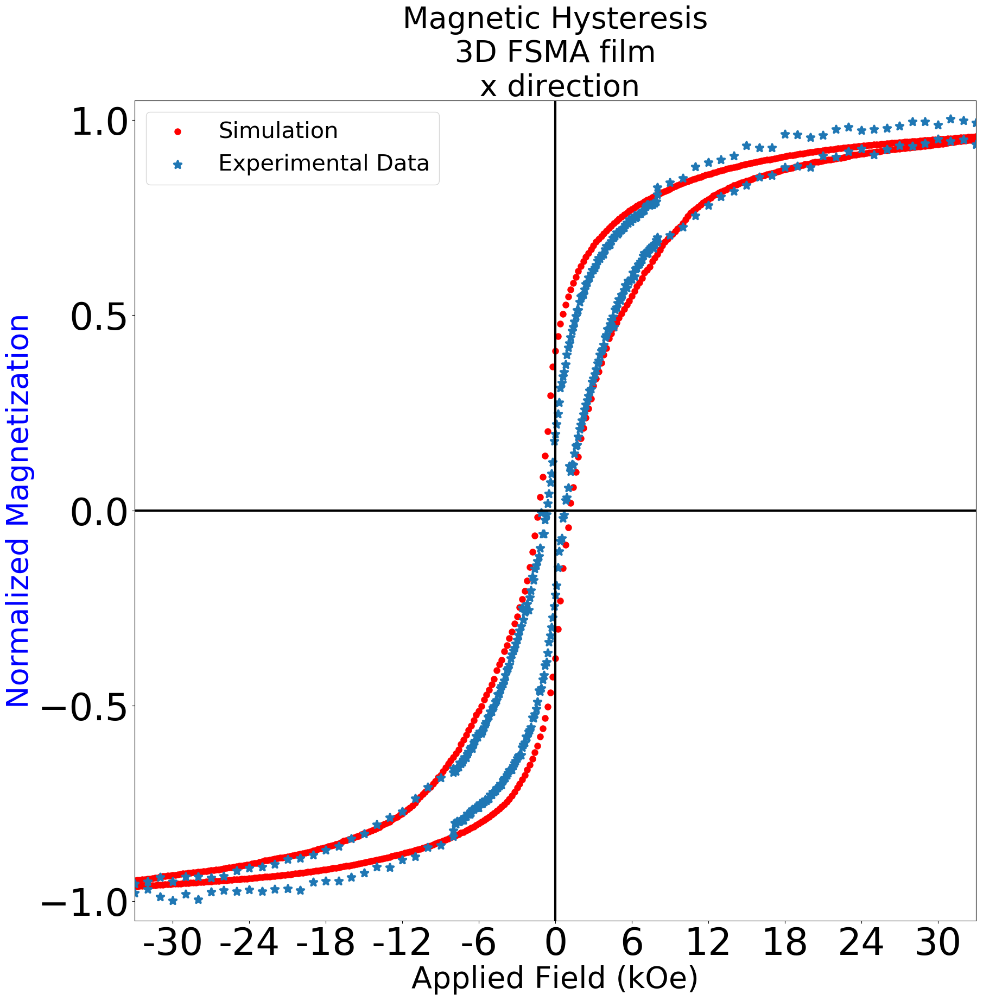

In [207]:
# print(maglist)

#import matplotlib.ticker.FuncFormatter
import pylab as plt
import matplotlib.ticker as ticker

stepplot=(hfinal-hini)/5

plt.figure(figsize=(20,20),dpi=100)

#plt.scatter(results[0][1][:200],results[0][0][9],color="r",label="positive branch",linewidth=3.)
scale=2
ll=2

summ3=(np.array(maglistfinalcorrected[0:300*scale*ll])+np.array(maglistfinalcorrected2[0:300*scale*ll])+np.array(maglistfinalcorrected3[0:300*scale*ll]))/3.0
#summ3=np.array(maglistfinalcorrected[0:300*scale*ll])

#plt.scatter(results[0][1][0:300*scale*ll]+np.array(0*200),np.array(maglistfinalcorrected[0:300*scale*ll])*1.090*0.9997929990002929999,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300*scale])+np.array(-0*200),-np.array(maglistfinalcorrected[0:300*scale])*1.090*0.9997929990002929999,color="g",linewidth=3.)
plt.scatter(results[0][1][0:300*scale*ll]+np.array(0*200),(summ3)*1.02*0.9897929990002929999,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300*scale*ll])+np.array(0*200),-(np.array(maglistfinalcorrected[0:300*scale*ll])+np.array(maglistfinalcorrected2[0:300*scale*ll])+np.array(maglistfinalcorrected3[0:300*scale*ll]))/1.0*1.090*0.9997929990002929999,color="r",label="Simulation",linewidth=3.)
plt.axvline(x=0.00,color='black',linewidth=3)
plt.axhline(y=0.00,color='black',linewidth=3)

#plt.scatter(hlistnegfinal,maglistnegfinalcorrected,label="negative branch",linewidth=3.)
#plt.scatter(-np.array(results[0][1][:300])+np.array(+0*200),-np.array(maglistfinalcorrected)/1.05,color="r",label="positive branch",linewidth=3.)
plt.scatter(hexp,np.array(mexp)/1.01,label="Experimental Data",linewidth=3.,marker='*',s=100)
#plt.axis([hini,hfinal,-1.1,1.1])
plt.xticks([hini+stepplot/4*k for k in range(0,2*12)],fontsize=50)
plt.gca().get_xaxis().set_major_formatter(ticker.FuncFormatter(lambda x, p: format(int(x/1000), ',')))
plt.yticks([-1.0+0.5*k for k in range(0,11)],fontsize=50)
plt.title(" Magnetic Hysteresis \n 3D FSMA film \n x direction",fontsize=40)
plt.xlabel("Applied Field (kOe)",fontsize=40)
plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
plt.legend(fontsize=30)
plt.xlim(-33000,33000)
plt.ylim(-1.05,1.05)
#plt.savefig("figsarticle/new/2019_FSMA_film_eixox_10k_.jpg")
plt.savefig("teste_2019_FSMA_NMB_eixoy_10k_.jpg")

plt.show()


In [37]:
path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_perptubeaxis_h.dat'
#path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_alongtubeaxis_h.dat'

hexp10ktube = open(path,'r')
hexp=hexp10ktube.readlines()

print(hexp[0])
#print(a1[0][1])

hexp10ktube.close()

hexp = [float(i) for i in hexp]


path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_perptubeaxis_m.dat'
#path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_alongtubeaxis_m.dat'
mexp10ktube = open(path,'r')
mexp=mexp10ktube.readlines()

print(mexp[0])
#print(a1[0][1])

mexp10ktube.close()

mexp = [float(i)*1.00 for i in mexp]


39999.46094

0.94869



In [110]:
int(len(results[0][8])/300)
int(len(results[0][8]))

60000

In [186]:
scale=2

plt.figure(figsize=(2*80,2*80))
#for i in range(int(len(results[0][8])/300/scale)):
for i in range(100):
#    plt.figure(figsize=(20,20),dpi=100)
#    plt.subplot(ndivr+1, ndivr+1, i+1)
    plt.subplot(10, 10, i+1)

#    plt.scatter(results[0][1][0:300],results[0][8][300*i:300*(i+1)],color="r",label="positive branch",linewidth=3.)
    plt.scatter(results[0][1][0:300*scale],np.array(results[0][8][300*scale*i:300*scale*(i+1)]),color="r",label="positive branch",linewidth=3.)
#    plt.scatter(-np.array(results[0][1][0:300]),results[0][9][300*i:300*(i+1)],color="black",label="other branch",linewidth=3.)
    plt.scatter(-np.array(results[0][1][0:300*scale]),np.array(results[0][9][300*scale*i:300*scale*(i+1)]),color="black",label="other branch",linewidth=3.)
    #plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
    #plt.axis([hini,hfinal,-1.1,1.1])
    plt.xticks([hini+stepplot/2*k for k in range(0,12)],fontsize=25)
    plt.yticks(fontsize=25)
    plt.axvline(x=0.00,color='black',linewidth=3)
    plt.axhline(y=0.00,color='black',linewidth=3)

    plt.title(" Z Comp. Mag  \n Along Tube Axis",fontsize=40)
    plt.xlabel("Applied Field (Oe)",fontsize=40)
    plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
    plt.legend(fontsize=30)

plt.savefig("oo_hist_10k.pdf")

plt.show()

In [2149]:
len(results[0][9])/300

202.0

In [467]:


somahistlist=[]

for i in range(300):
    soma=0
    for j in range(int(len(results[0][8])/300)):
        soma+=results[0][8][300*j+i]
    somahistlist.append(soma)

    
somahistlist2=[]
for i in range(300):
    soma=0
    for j in range(int(len(results[0][9])/300)):
        soma+=results[0][9][300*j+i]
    somahistlist2.append(soma)
    


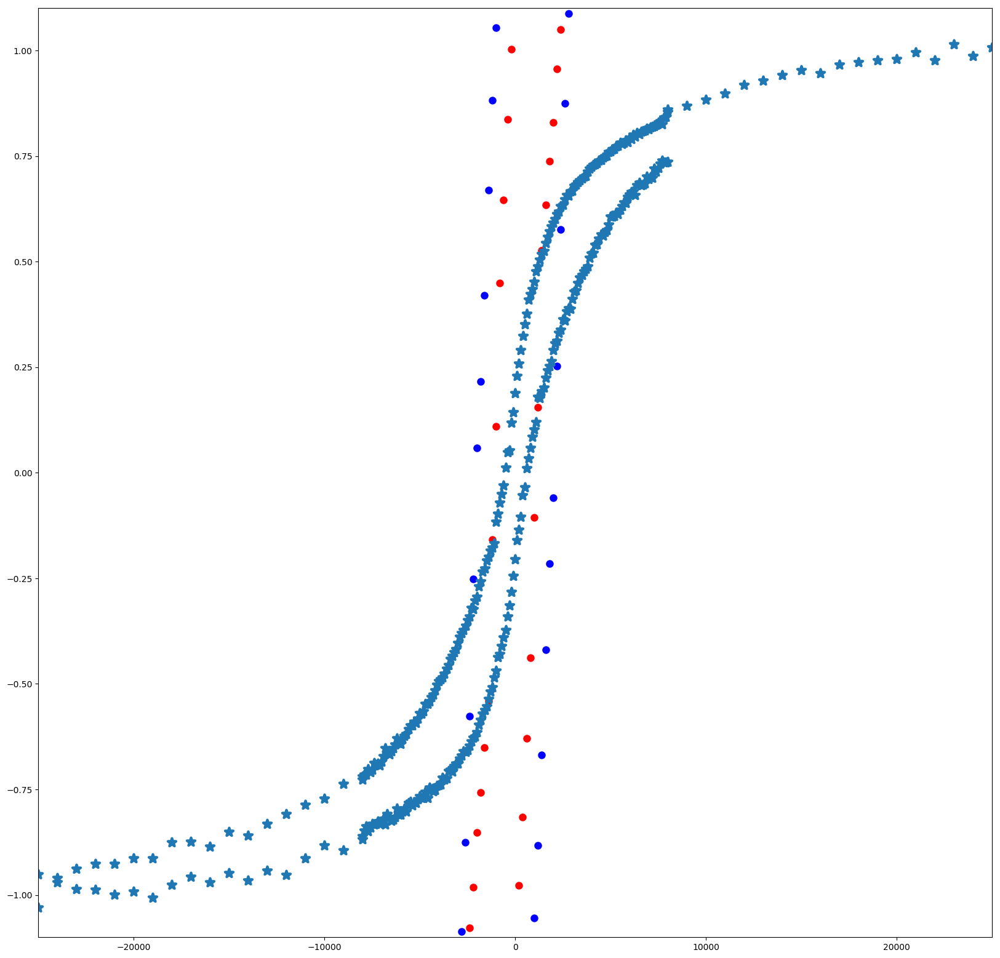

In [468]:
plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300]+np.array(0*200),np.array(somahistlist)/100*0.95,color="r",label="Simulation",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.xlim(-25000,25000)
plt.ylim(-1.1,1.1)

plt.show()



In [208]:
# for magnetostrictivity!
# for responsive!

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][10][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][11][300*scale*j+i]
    somahistlist2.append(soma)


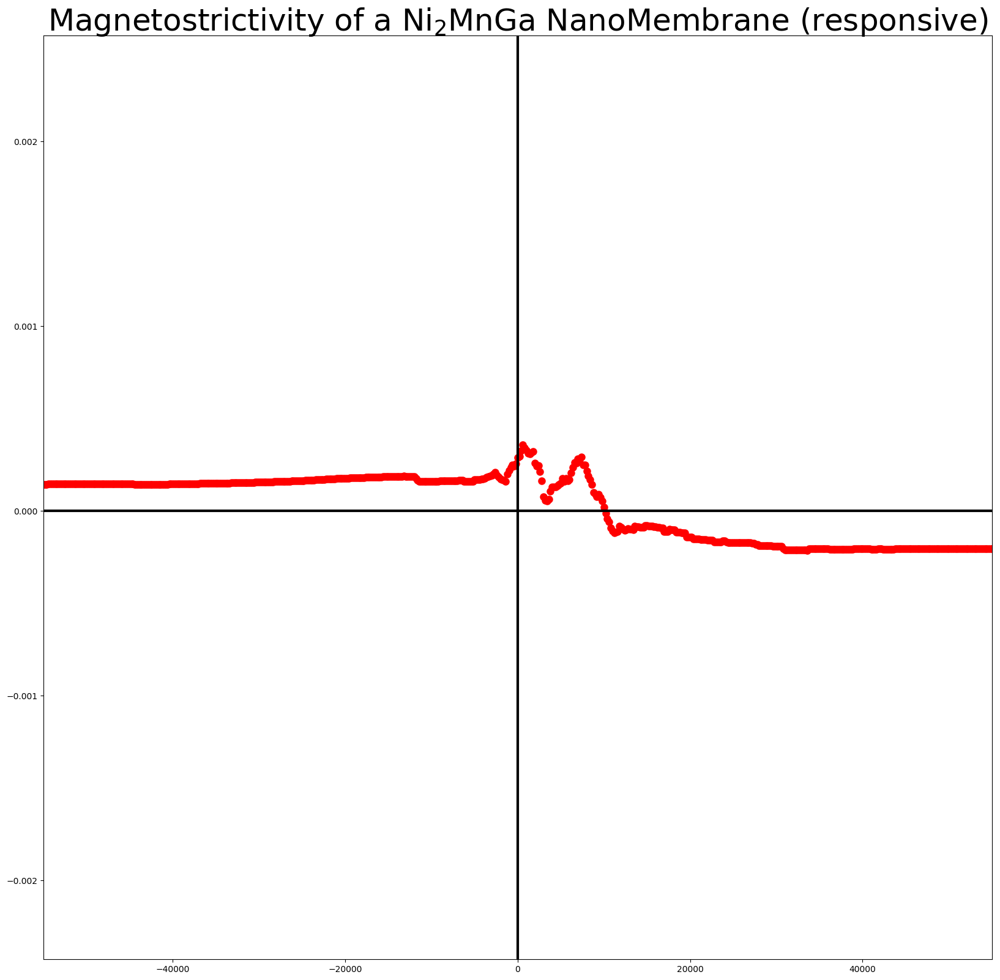

In [209]:
plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/26/26,color="r",label="Positive Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*5]+np.array(0*200),np.array(somahistlist2)/26/26,color="b",label="Negative Branch",linewidth=3.)
plt.title("Magnetostrictivity of a Ni$_2$MnGa NanoMembrane (responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()



In [210]:
# for magnetostrictivity!
# for non-responsive!

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][12][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][13][300*scale*j+i]
    somahistlist2.append(soma)





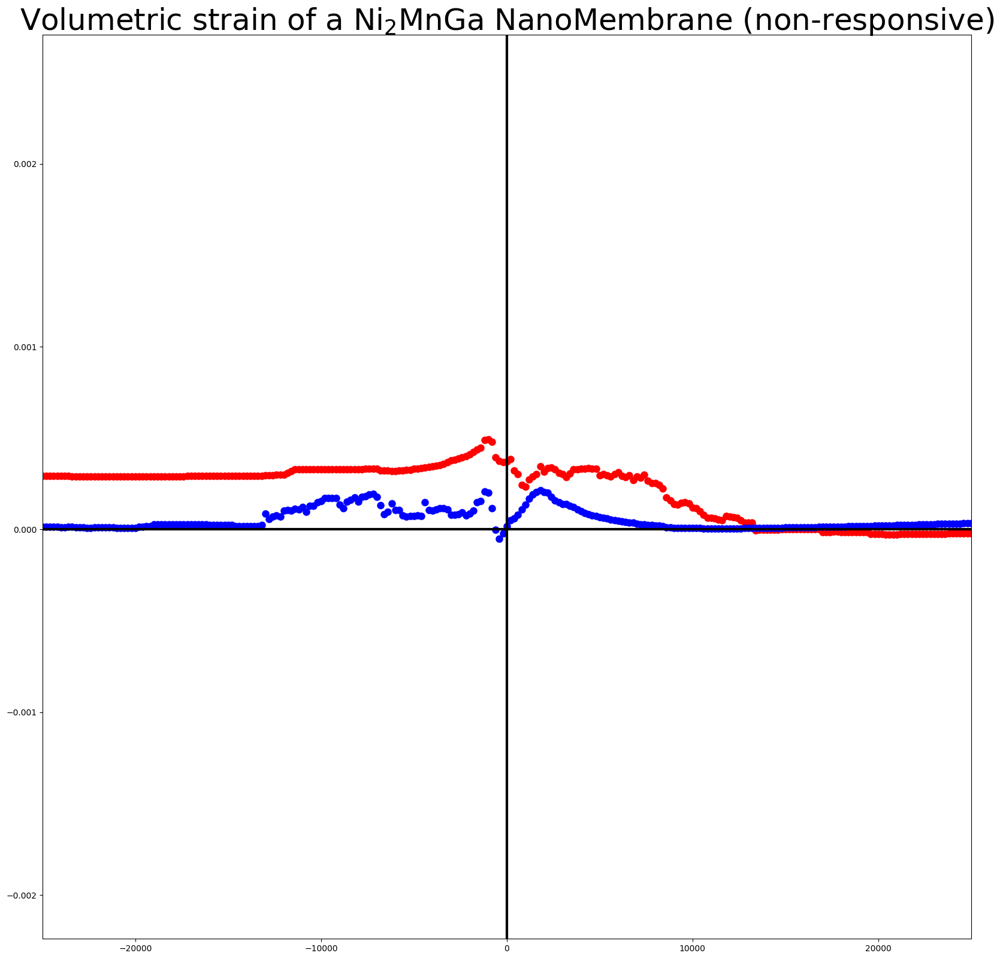

In [211]:

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/26/26,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300*scale])+np.array(0*200),np.array(somahistlist2)/26/26,color="b",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-25000,25000)
#plt.ylim(-1.1,1.1)

plt.show()






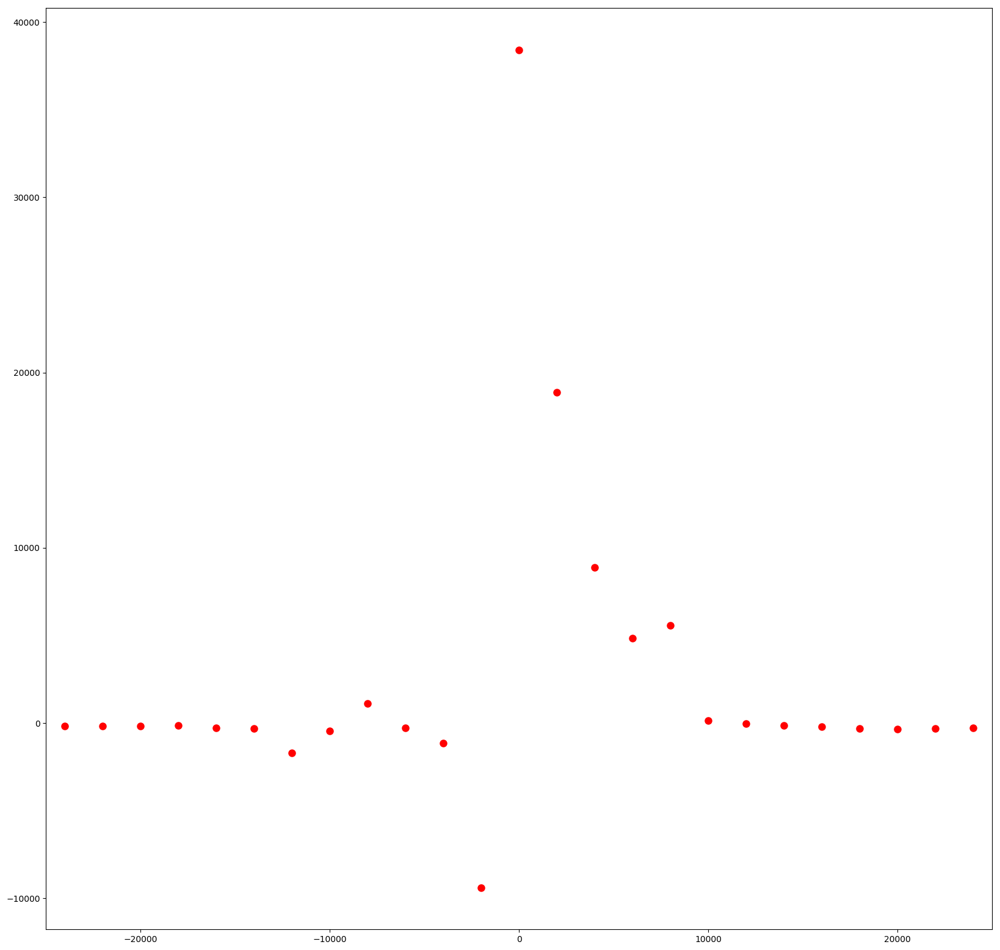

In [1218]:

fieldlist = np.array(results[0][1][0:300*scale])
magty = np.array(somahistlist)/17/17

derivmagty = []
fieldlistnew = []
nbins=10
for i in range(int((len(magty))/nbins)-2):
    somabin = 0
    for j in range(0,nbins):
        somabin+=(magty[nbins*i+j]-magty[nbins*i+j-1])/(fieldlist[nbins*i+j]- fieldlist[nbins*i+j-1])*10**9
    derivmagty.append(somabin)
    fieldlistnew.append(fieldlist[nbins*i])
#    print((magty[i+1]-magty[i])/(fieldlist[i+1]- fieldlist[i]))
    
plt.figure(figsize=(20,20),dpi=100)
plt.scatter(fieldlistnew,derivmagty,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.xlim(-25000,25000)
#plt.ylim(-1.1,1.1)

plt.show()

In [191]:
# for responsive!
# strain y-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][14][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][15][300*scale*j+i]
    somahistlist2.append(soma)





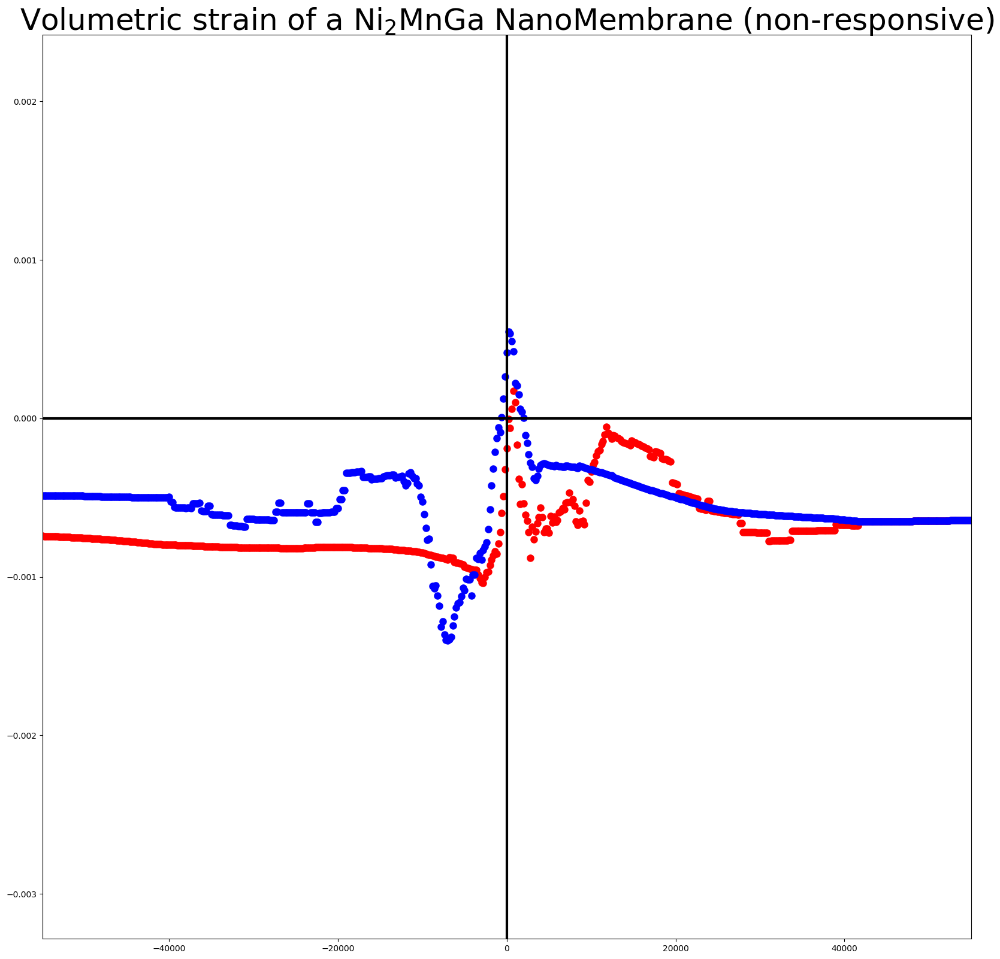

In [192]:


plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300*scale])+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()






In [193]:


# for non-responsive!
# strain y-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][16][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][17][300*scale*j+i]
    somahistlist2.append(soma)






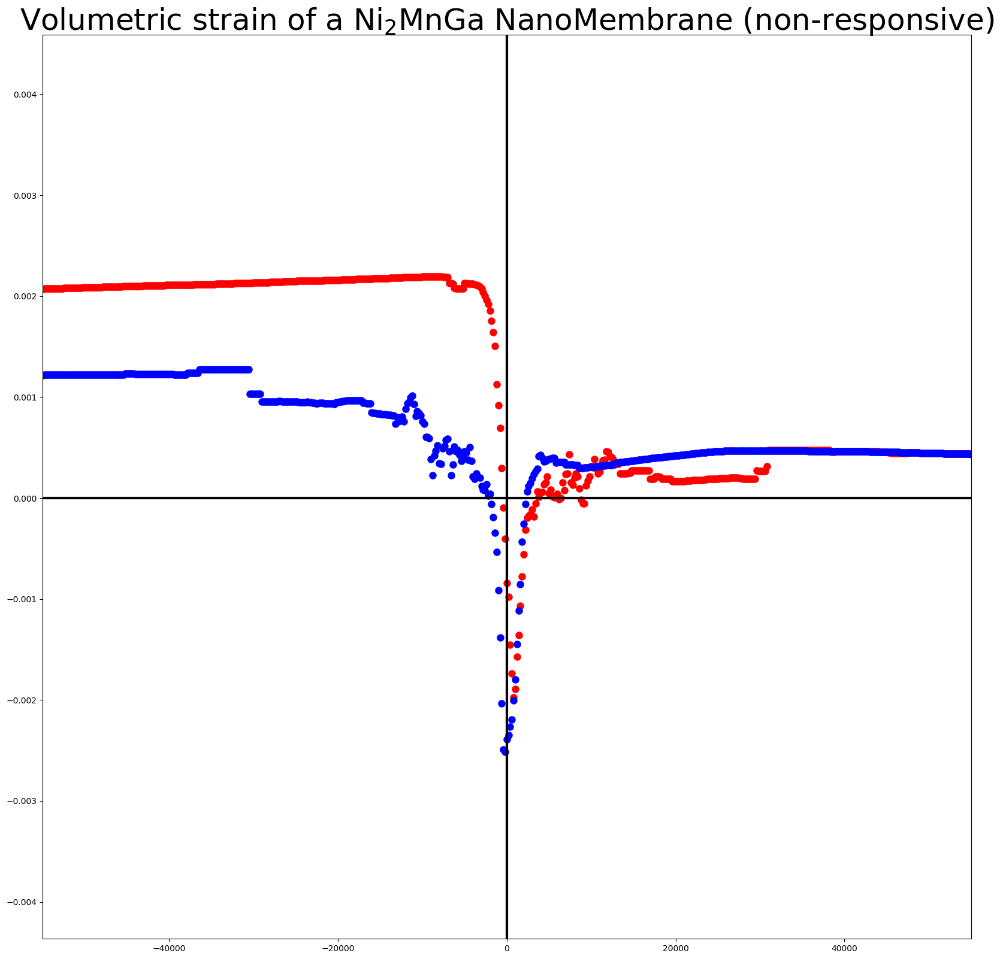

In [194]:




plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300*scale])+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()







In [197]:


# for responsive!
# strain x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][18][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][19][300*scale*j+i]
    somahistlist2.append(soma)









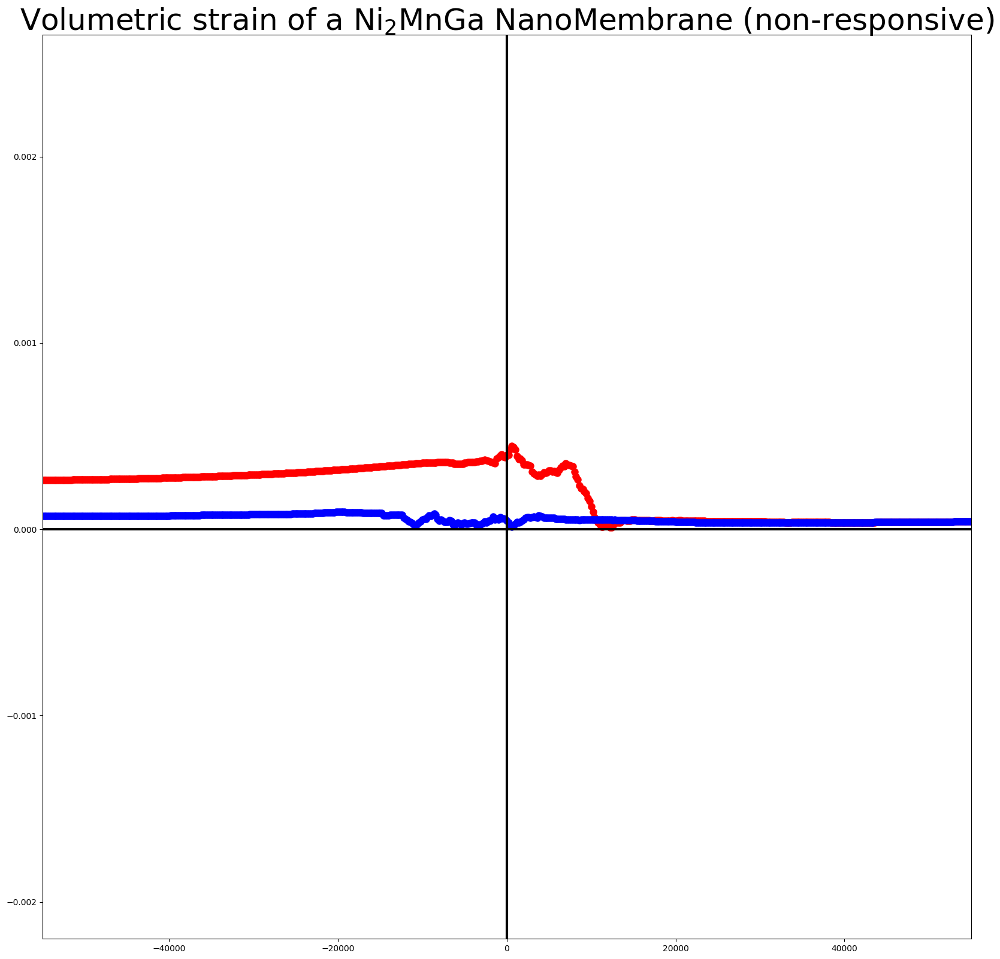

In [198]:





plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/26/26,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(-np.array(results[0][1][0:300*scale])+np.array(0*200),np.array(somahistlist2)/26/26,color="b",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()










In [199]:




# for responsive!
# magnetization x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][20][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][21][300*scale*j+i]
    somahistlist2.append(soma)


somahistlist3=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][22][300*scale*j+i]
    somahistlist3.append(soma)










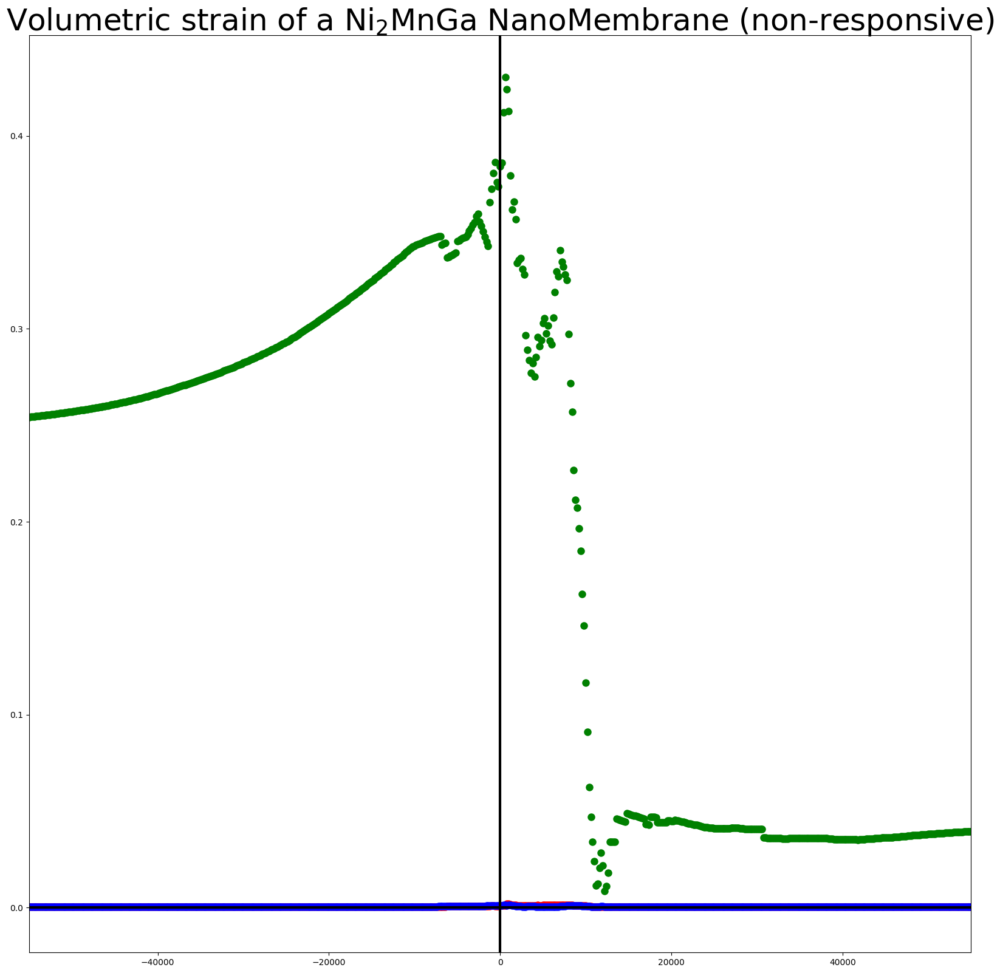

In [200]:






plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()












In [50]:
len(results[0][22][:])


202800

In [201]:




# for non-responsive!
# magnetization x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][23][300*scale*j+i]
    somahistlist.append(soma)


# magnetization y-direction

somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][24][300*scale*j+i]
    somahistlist2.append(soma)

# magnetization z-direction
    

somahistlist3=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][25][300*scale*j+i]
    somahistlist3.append(soma)



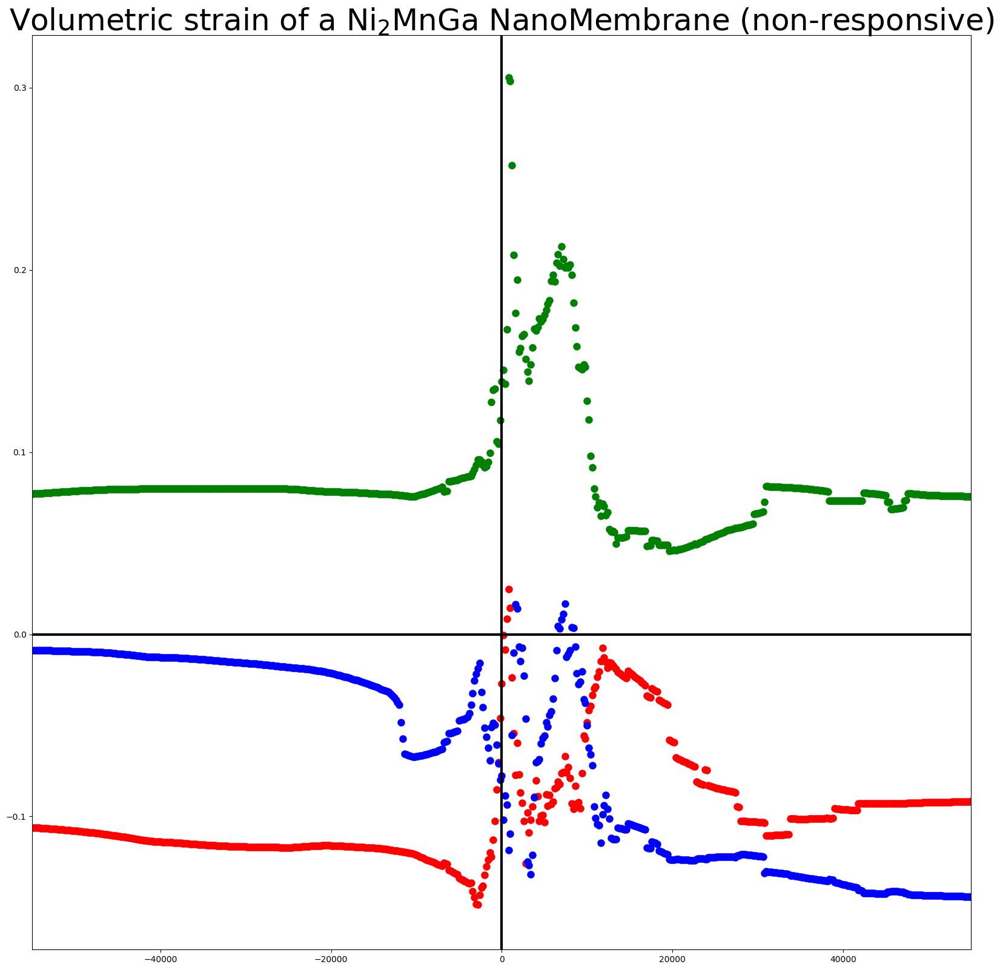

In [202]:






plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()












In [203]:




# for total magnetization!

# magnetization x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][26][300*scale*j+i]
    somahistlist.append(soma)


# magnetization y-direction

somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][27][300*scale*j+i]
    somahistlist2.append(soma)

# magnetization z-direction
    

somahistlist3=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][28][300*scale*j+i]
    somahistlist3.append(soma)



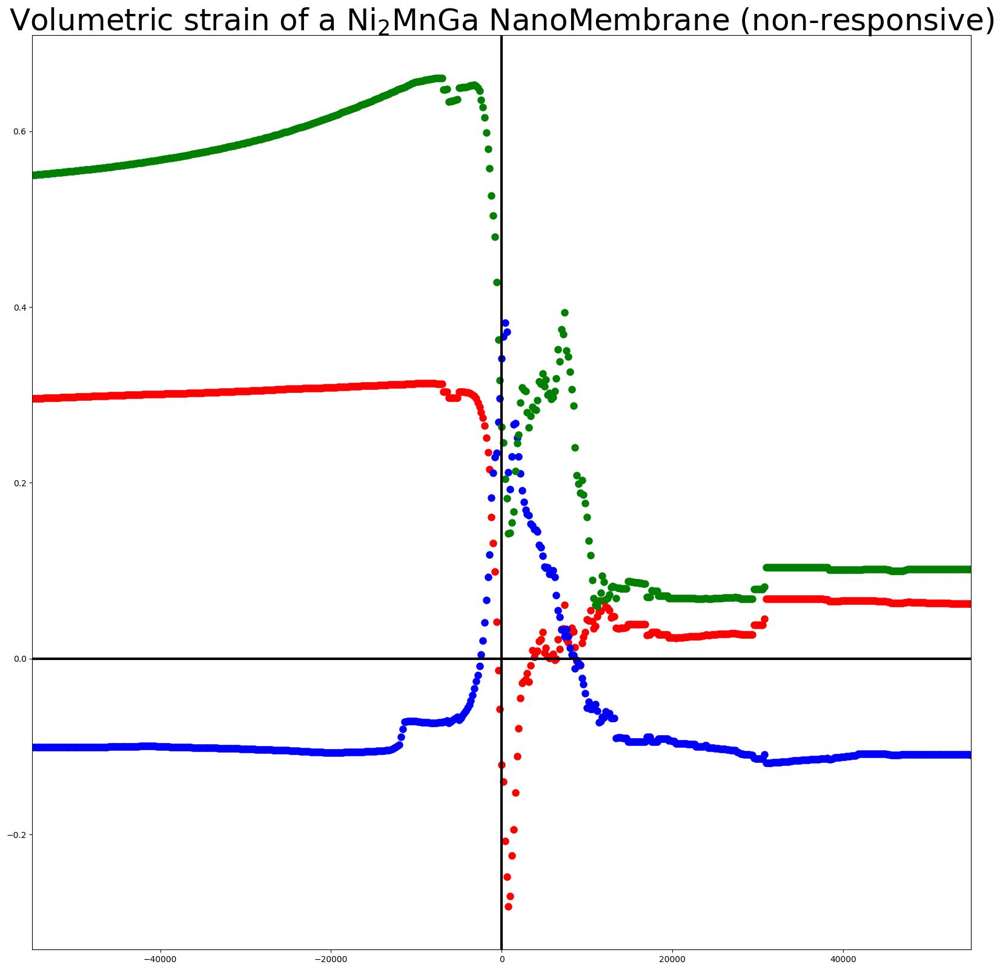

In [204]:






plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()












In [55]:

# drawing the magnetization components!

scale=1

comp_x=results[0][23][:]
comp_y=results[0][24][:]
comp_z=results[0][25][:]


# at field remanence!

comp_x_reman = []
for i in range(int(len(comp_x)/300.)-1):
    comp_x_reman.append(comp_x[150+300*(i+1)])

comp_y_reman = []
for i in range(int(len(comp_y)/300.)-1):
    comp_y_reman.append(comp_y[150+300*(i+1)])

comp_z_reman = []
for i in range(int(len(comp_z)/300.)-1):
    comp_z_reman.append(comp_z[150+300*(i+1)])



In [ ]:
len(comp_x_reman)

In [2]:
#xv, yv,zv = np.meshgrid(comp_x_reman, comp_y_reman,comp_z_reman, sparse=False, indexing='ij')


In [ ]:
basegrid=[i for i in range(len(comp_x_reman))]

In [ ]:
basegridx=[]
basegridy=[]
basegridz=[]

for i in range(len(comp_x_reman)):
    basegridz.append(1.)

len_comp_sqrt=int(np.sqrt(len(comp_x_reman)))

for i in range(len_comp_sqrt+1):
    for j in range(len_comp_sqrt+1):
        if(i==j==len_comp_sqrt):
            pass
        else:
            basegridy.append(j+1)
            basegridx.append(i+1)


In [ ]:
#xgrid, ygrid,zgrid = np.meshgrid(basegrid, basegrid,basegrid, sparse=False, indexing='ij')
print(len(basegridx))
print(len(comp_x_reman))
basegridx[-1]

In [ ]:
#plt.figure(figsize=(20,20),dpi=100)

"""
for i in range(len(basegrid)):
    for j in range(len(basegrid)):
        for k in range(len(basegrid)):
"""            

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
fig = plt.figure(figsize=(20,20),dpi=200)
ax = fig.gca(projection='3d')
#ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")

#x = [0, 10, 0, 10,0, 10, 0, 10]
#y = [0, 0, 10, 10,0, 0, 10, 10]
#z = [0.9, 0.9, 0.9, 0.9,1.2,1.2,1.2,1.2]
x = [0, 11,11]
y = [0, 0,11]
x1 = [0, 0,11,0.1,11.1,11.1]
y1 = [0, 11,11,0.1, 0.1,11.1]
z = [1.0,1.0,1.0,1,1,1]
verts = [list(zip(x, y, z))]
verts1 = [list(zip(x1, y1, z))]
#print(verts)
coll=Poly3DCollection(verts1,alpha=0.4)
face_color = [1.0, 1.0, 0] # alternative: matplotlib.colors.rgb2hex([0.5, 0.5, 1])
coll.set_facecolor(face_color)
ax.add_collection3d(coll, zs='z')
#ax.add_collection3d(Poly3DCollection(verts,facecolors='g',alpha=.5), zs='z')
"""
coll=Poly3DCollection(verts1,alpha=1)
face_color = [0.0, 0.5, 0] # alternative: matplotlib.colors.rgb2hex([0.5, 0.5, 1])
coll.set_facecolor(face_color)
ax.add_collection3d(coll, zs='z')
"""


ax.set_xlim3d(-0, 11)
ax.set_ylim3d(-0, 11)
ax.set_zlim3d(1, 2.5)
#ax.grid(False)
# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
#ax.quiver(xgrid[:2], ygrid[:2], zgrid[:2], (xgrid+xv)[:2], (ygrid+yv)[:2], (zgrid+zv)[:2], length = 0.5, normalize = False)
#ax.quiver([0,1], [0,0], [0,0], [0,2], [1,1], [1,0], length = 0.5, normalize = False)
ax.quiver( basegridx, basegridy,basegridz,np.array(comp_x_reman)+np.array(basegridx),np.array(comp_y_reman)+np.array(basegridy), np.array(comp_z_reman)+np.array(basegridz), length = 0.25, normalize = True,edgecolor='b',facecolor='r',linewidth=2.5)
ax.axis('off')



plt.savefig('figfilm.png')

plt.show()

In [ ]:
xgrid[:1,6]

In [ ]:
len(basegrid)

In [ ]:
len(xgrid)

In [ ]:
X, Y, Z = np.mgrid[-10:10:100j, -10:10:100j, -10:10:100j]


In [ ]:
X[88,0]

In [1909]:




# for total magnetization!

# magnetization x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][31-3][300*scale*j+i]
    somahistlist.append(soma)


# magnetization y-direction

somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][32-3][300*scale*j+i]
    somahistlist2.append(soma)

# magnetization z-direction
    

somahistlist3=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][33-3][300*scale*j+i]
    somahistlist3.append(soma)



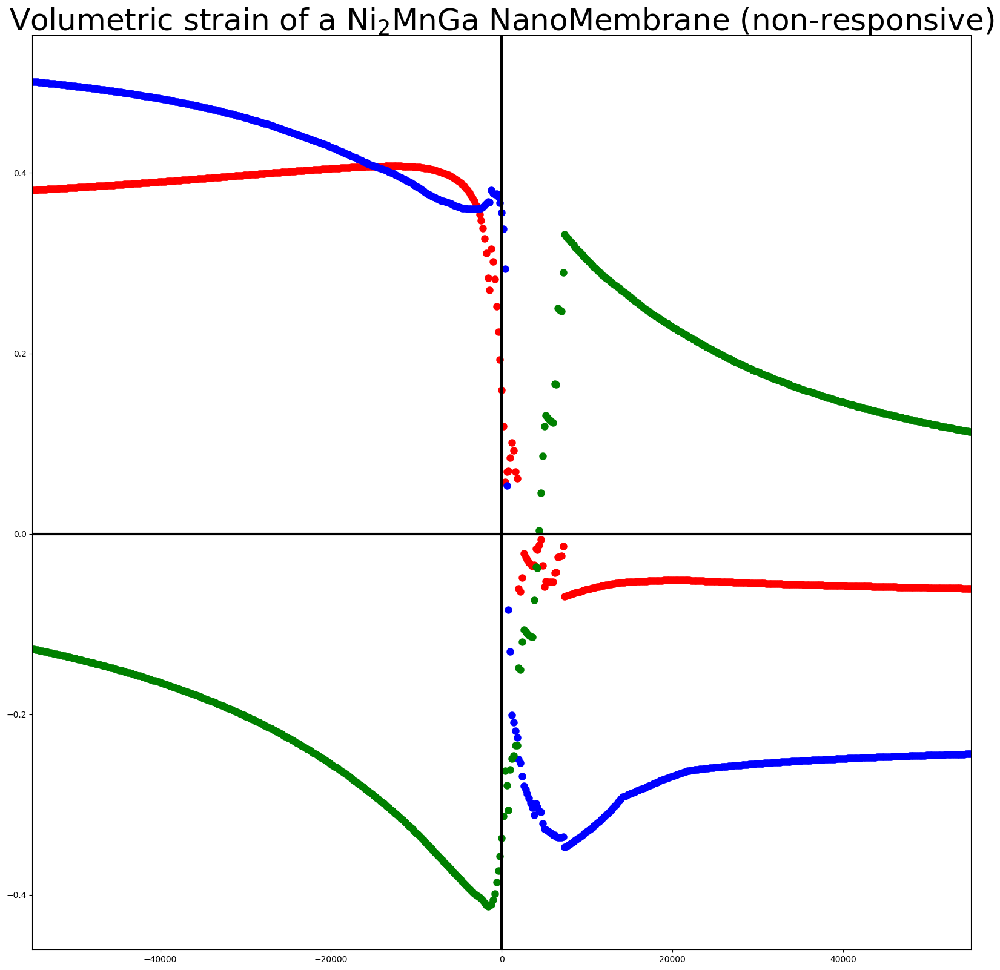

In [1910]:

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()


In [205]:




# for total magnetization!

# magnetization x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][31][300*scale*j+i]
    somahistlist.append(soma)


# magnetization y-direction

somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][32][300*scale*j+i]
    somahistlist2.append(soma)

# magnetization z-direction
    

somahistlist3=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][33][300*scale*j+i]
    somahistlist3.append(soma)



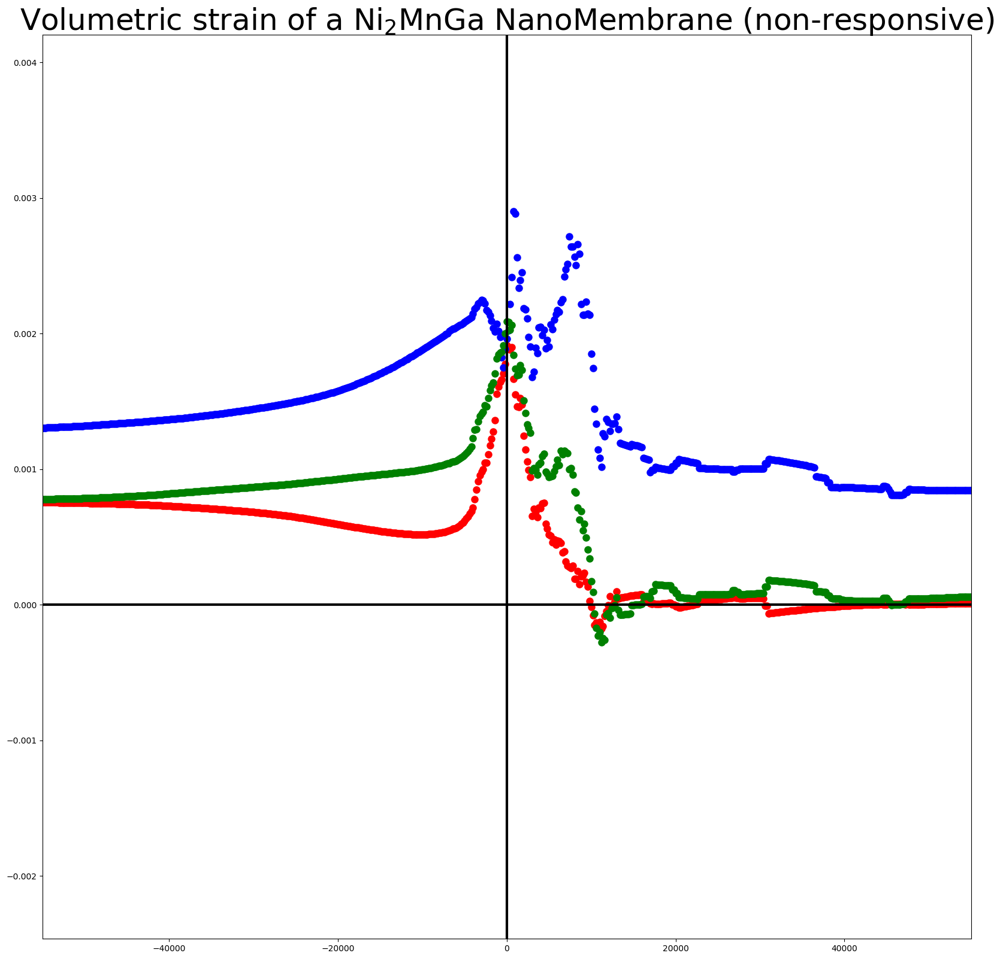

In [206]:

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()


In [2442]:
len(results[0])

50

In [2443]:
results[0][38]

[-0.004519529631758157,
 0.004991025920722389,
 -0.004378583844130035,
 0.0045821045149023135,
 0.0045492597017796135,
 0.004548382476592442,
 -0.004419975731306129,
 -0.004378577854961212,
 0.004992821353658134,
 -0.004995213353274786,
 0.003075967177911333,
 -0.0010703730579867436,
 0.0016755535916526134,
 0.0015751812537337572,
 0.0014628706882315015,
 -0.0011488307719367571,
 0.003939036195494451,
 -0.00102706296329545,
 -0.001071605028982225,
 0.00307596731742066,
 0.0036036442418371675,
 -0.0006336623302076103,
 0.0044166975772586044,
 -0.0011473158244595192,
 -0.0054567655898356306,
 -0.0036605517518682774,
 -0.001489456471954326,
 0.00441684652341197,
 -0.0006513681688454741,
 0.003330691862375729,
 0.0036036420267380564,
 0.003922331671385213,
 -0.001200231290600599,
 0.0002309173125357171,
 -0.004236309936142884,
 -0.0042363257759751305,
 -0.0031711677374735396,
 -0.0012005484046109772,
 0.003922359760559739,
 0.0022752132061071313,
 0.0028704543566083957,
 -0.000991203715863

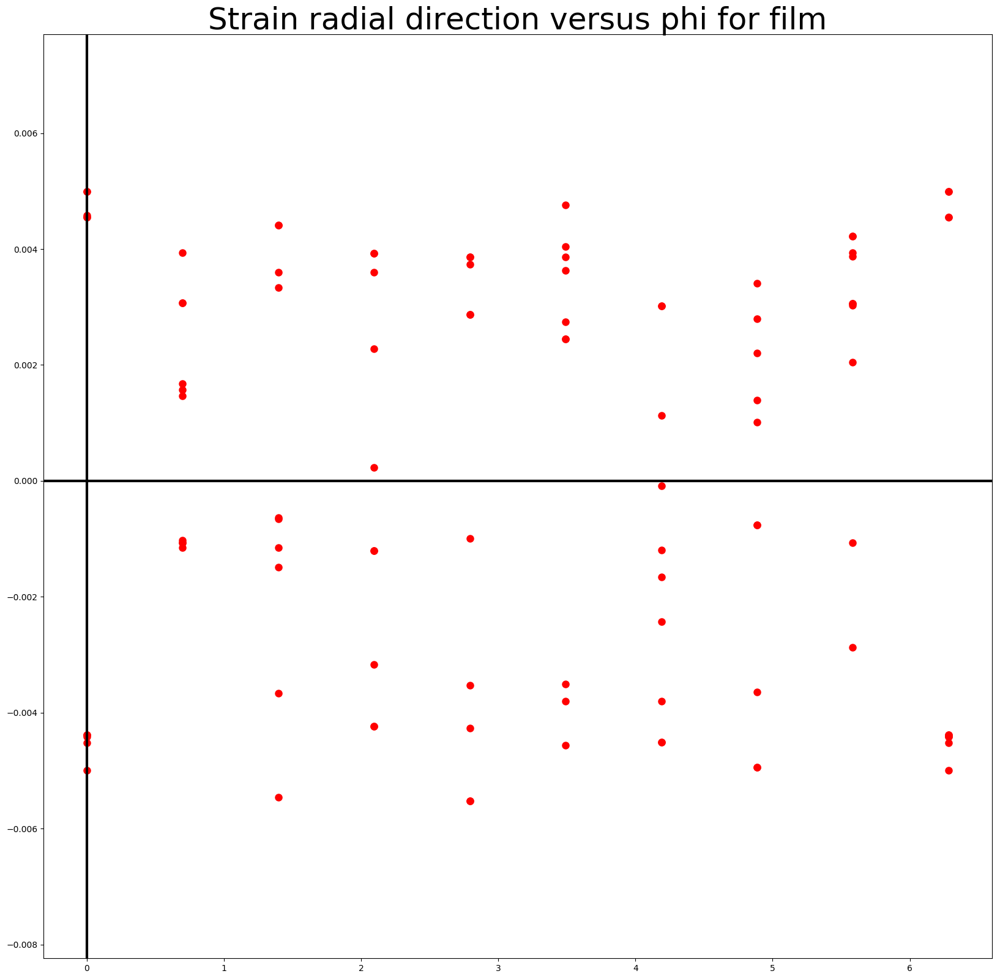

In [2444]:


plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][35],np.array(results[0][38]),color="r",label="Positive Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Strain radial direction versus phi for film",size=36)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
#plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)


plt.savefig("strainz_total_NMB.png")

plt.show()



In [1915]:
listtosort=results[0][38]

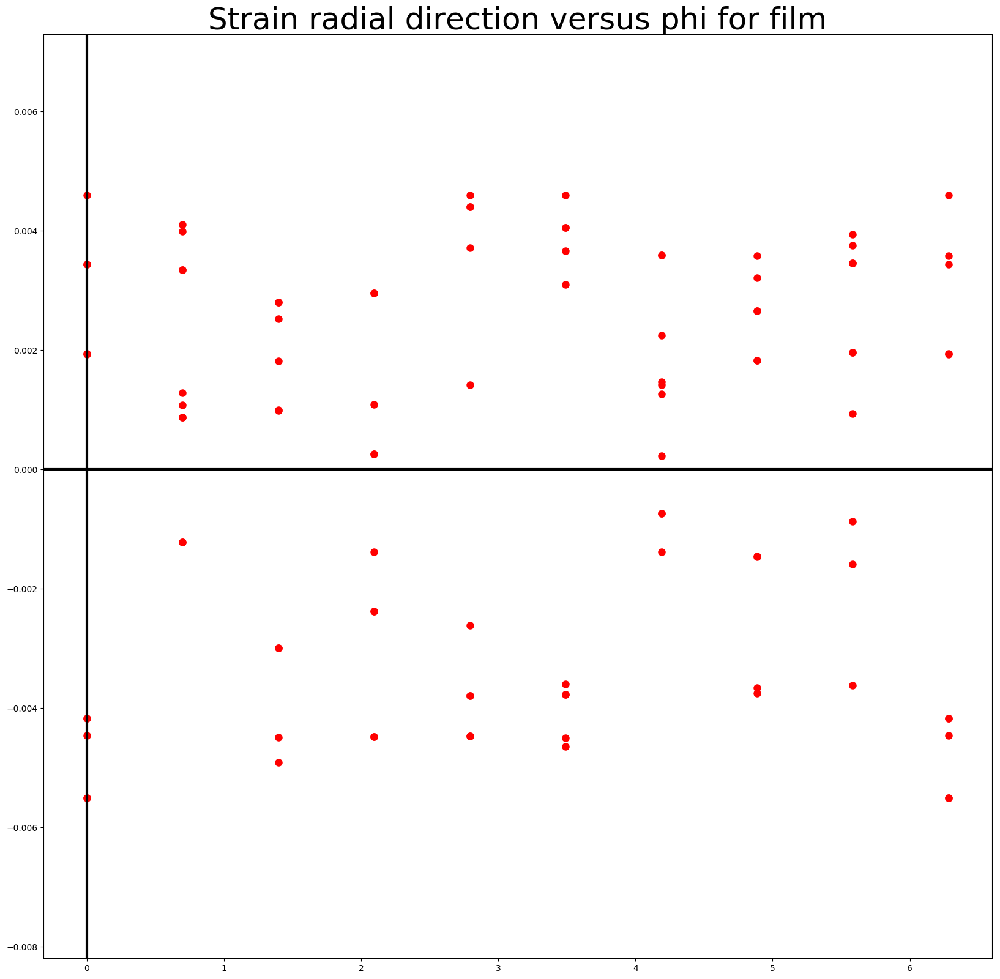

In [2445]:
# secondloop

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][35+5],np.array(results[0][38+5]),color="r",label="Positive Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Strain radial direction versus phi for film",size=36)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
#plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)


plt.savefig("strainz_total_NMB.png")

plt.show()



In [1918]:
results[0][48][0]

[-0.004222375259009152,
 -0.0007796959121452443,
 -0.004562839292309936,
 -0.00449146309556359,
 -0.0042694305918243225,
 -0.004389488361083523,
 -0.004491422428684522,
 -0.004562860853209486,
 -0.0007875623078786979,
 -0.004222375262325909]

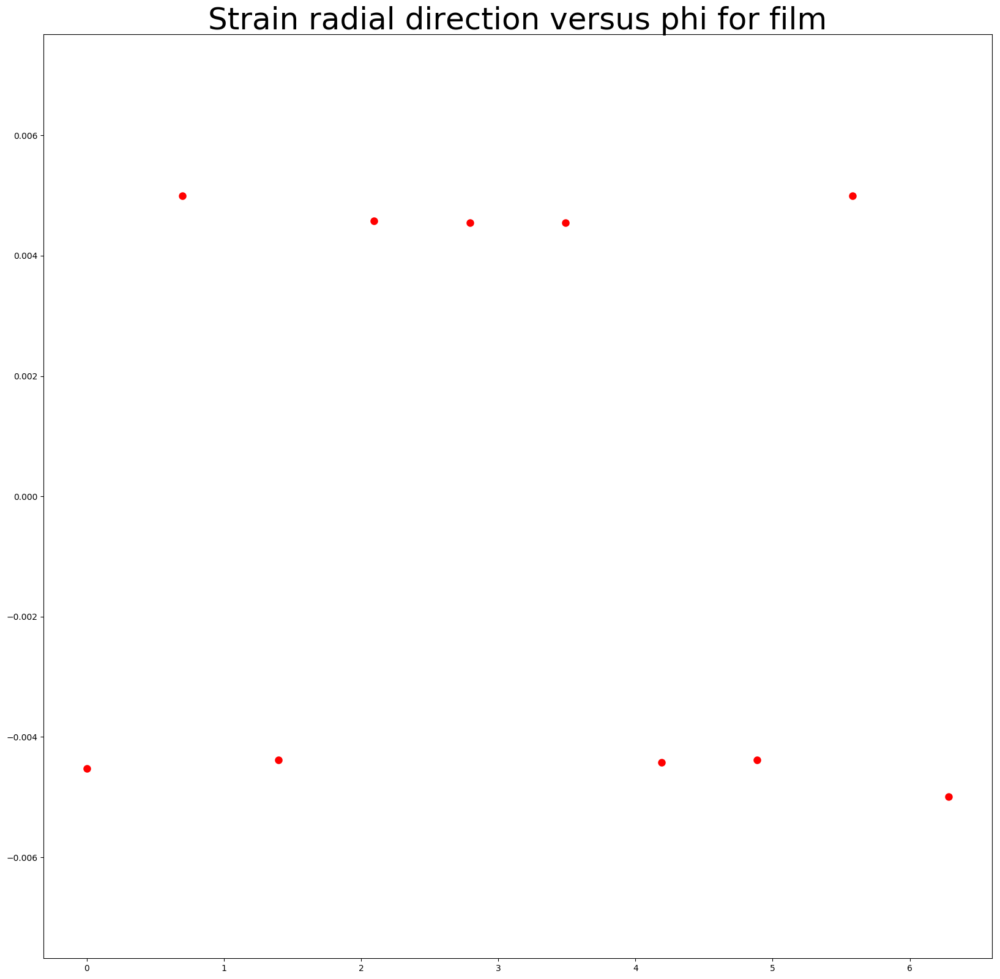

In [2446]:
# secondloop

indi=5

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][34+10][indi],np.array(results[0][38+10][indi]),color="r",label="Positive Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Strain radial direction versus phi for film",size=36)
#plt.axvline(0,0,color="black",linewidth=3.)
#plt.axhline(0,0,color="black",linewidth=3.)
#plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)


plt.savefig("strainz_total_NMB.png")

plt.show()



In [2447]:
scale=2

plt.figure(figsize=(2*80,2*80))
#for i in range(int(len(results[0][8])/300/scale)):
for i in range(10*10):
#    plt.figure(figsize=(20,20),dpi=100)
#    plt.subplot(ndivr+1, ndivr+1, i+1)
    plt.subplot(10,10, i+1)

    
    plt.scatter(results[0][34+10][i],np.array(results[0][36+10][i]),color="r",label="Positive Branch",linewidth=3.)
    
#    plt.scatter(results[0][1][0:300],results[0][8][300*i:300*(i+1)],color="r",label="positive branch",linewidth=3.)
#    plt.scatter(results[0][1][0:300*scale],np.array(results[0][8][300*scale*i:300*scale*(i+1)]),color="r",label="positive branch",linewidth=3.)
#    plt.scatter(-np.array(results[0][1][0:300]),results[0][9][300*i:300*(i+1)],color="black",label="other branch",linewidth=3.)
#    plt.scatter(-np.array(results[0][1][0:300*scale]),np.array(results[0][9][300*scale*i:300*scale*(i+1)]),color="black",label="other branch",linewidth=3.)
    #plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
    #plt.axis([hini,hfinal,-1.1,1.1])
#    plt.xticks([hini+stepplot/2*k for k in range(0,12)],fontsize=25)
    plt.yticks(fontsize=25)
#    plt.axvline(x=0.00,color='black',linewidth=3)
#    plt.axhline(y=0.00,color='black',linewidth=3)

    plt.title(" Z Comp. Mag  \n Along Tube Axis",fontsize=40)
    plt.xlabel("Applied Field (Oe)",fontsize=40)
    plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
    plt.legend(fontsize=30)

plt.savefig("strain_zerofield.pdf")

plt.show()

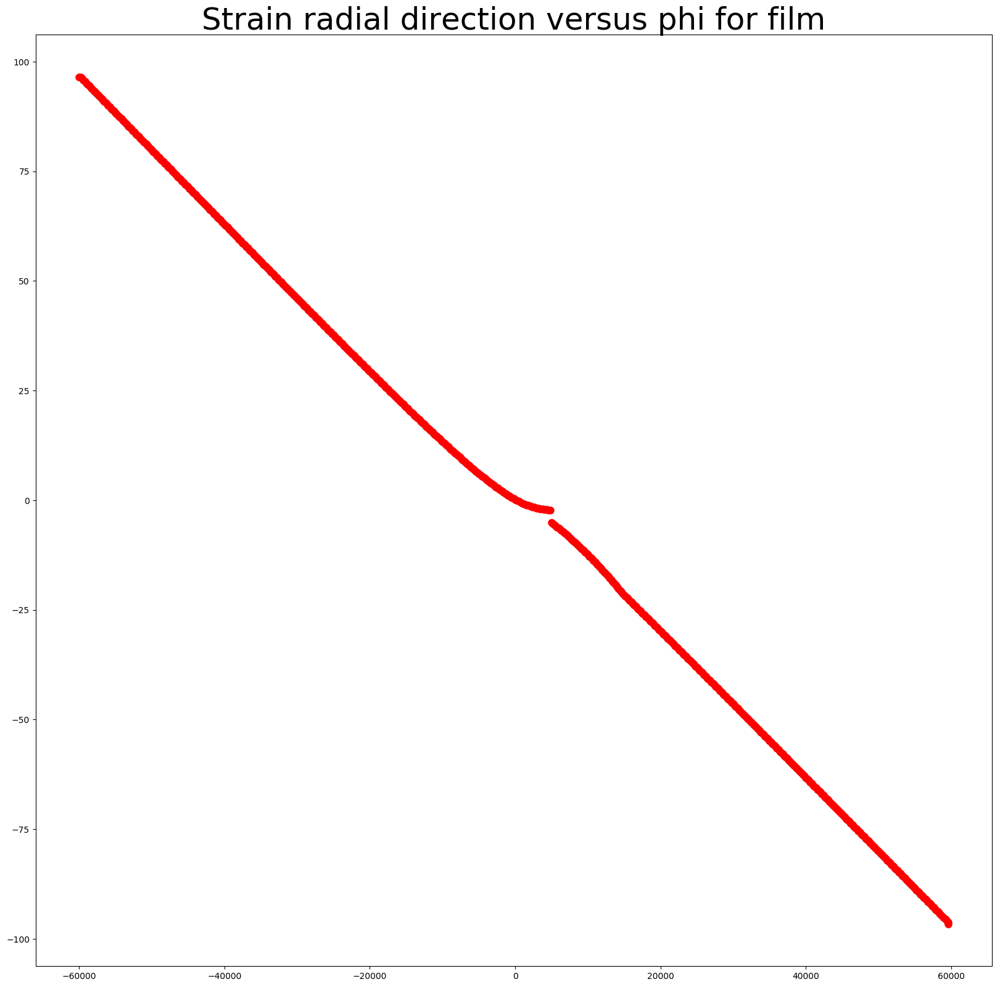

In [2449]:
# secondloop

scala=2

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale*1],np.array(results[0][39+10][0]),color="r",label="Positive Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),(np.array(somahistlist2))/10/10,color="b",label="Negative Branch",linewidth=3.)
#plt.scatter(results[0][1][0:300*scale*1]+np.array(0*200),np.array(somahistlist3)/10/10,color="g",label="Negative Branch",linewidth=3.)
plt.title("Strain radial direction versus phi for film",size=36)
#plt.axvline(0,0,color="black",linewidth=3.)
#plt.axhline(0,0,color="black",linewidth=3.)
#plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)


plt.savefig("strainz_total_NMB.png")

plt.show()



In [2450]:
len(results[0][49])

100

In [26]:
results[0][49]

[[-5.768821007971877,
  -5.768821007971877,
  -5.75741564802397,
  -5.74590861532599,
  -5.734330073079355,
  -5.72265510746999,
  -5.710897861000143,
  -5.699043515400686,
  -5.687102530439326,
  -5.675064691923639,
  -5.662946396331973,
  -5.650726300398261,
  -5.638421403166868,
  -5.626016203377183,
  -5.61352185067683,
  -5.600928377343136,
  -5.58823647653143,
  -5.5754551290247685,
  -5.562573254069595,
  -5.549602843789729,
  -5.536512516289212,
  -5.523340655186838,
  -5.510064209486734,
  -5.496680379702392,
  -5.483194184629763,
  -5.469614326575742,
  -5.455925390967196,
  -5.442138898379307,
  -5.428237820774414,
  -5.414240197991819,
  -5.400128945429838,
  -5.385907767008636,
  -5.3715776704039735,
  -5.3571489413634925,
  -5.342600240572492,
  -5.327944467330716,
  -5.313175539994328,
  -5.298297080652617,
  -5.2832998475002215,
  -5.268188433989546,
  -5.252962391748153,
  -5.237621948139527,
  -5.222159647616432,
  -5.2065843045456015,
  -5.190889544917597,
  -5.17507

In [2452]:
scale=2

plt.figure(figsize=(2*80,2*80))
#for i in range(int(len(results[0][8])/300/scale)):
for i in range(10*10):
#    plt.figure(figsize=(20,20),dpi=100)
#    plt.subplot(ndivr+1, ndivr+1, i+1)
    plt.subplot(10,10, i+1)

    
    plt.scatter(results[0][1][0:300*scale*1],np.array(results[0][39+10][i]),color="r",label="Positive Branch",linewidth=3.)
    
#    plt.scatter(results[0][1][0:300],results[0][8][300*i:300*(i+1)],color="r",label="positive branch",linewidth=3.)
#    plt.scatter(results[0][1][0:300*scale],np.array(results[0][8][300*scale*i:300*scale*(i+1)]),color="r",label="positive branch",linewidth=3.)
#    plt.scatter(-np.array(results[0][1][0:300]),results[0][9][300*i:300*(i+1)],color="black",label="other branch",linewidth=3.)
#    plt.scatter(-np.array(results[0][1][0:300*scale]),np.array(results[0][9][300*scale*i:300*scale*(i+1)]),color="black",label="other branch",linewidth=3.)
    #plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
    #plt.axis([hini,hfinal,-1.1,1.1])
#    plt.xticks([hini+stepplot/2*k for k in range(0,12)],fontsize=25)
    plt.yticks(fontsize=25)
#    plt.axvline(x=0.00,color='black',linewidth=3)
#    plt.axhline(y=0.00,color='black',linewidth=3)

    plt.title(" Stress between the variants",fontsize=40)
    plt.xlabel("Applied Field (Oe)",fontsize=40)
    plt.ylabel("Stress",color="b",fontsize=40)
    plt.legend(fontsize=30)

plt.savefig("stress_bet_variants.pdf")

plt.show()

In [152]:
results[0][52]

[[[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.20765279298163977],
  [0.42596824042493786, -0.2558727892224406],
  [0.3167904933843531, -0.4057780766291328]],
 [[-0.4709653496842059, -0.

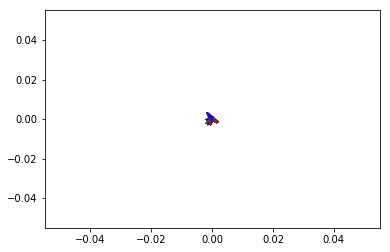

In [28]:

import numpy as np
import matplotlib.pyplot as plt

V = np.array(results[0][52])
origin = [0], [0] # origin point

plt.quiver(*origin, V[:,0], V[:,1], color=['r','b','g'], scale=21)
plt.show()



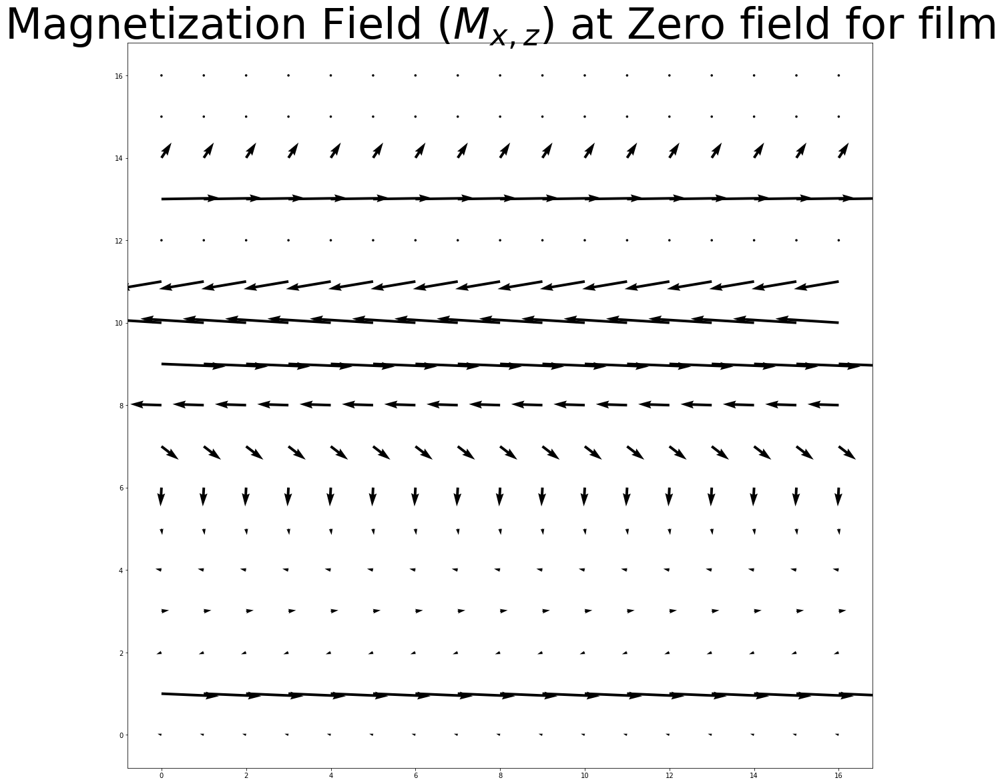

In [158]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

#V = np.array(results[0][50])
V = results[0][51]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

'''
fx=[]

for x,i in enumerate(V):
    fx.append(x[0][10*i])

# vectors y coordinate values
fy=tuple([x[1] for x in V])
'''

fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
    
X, Y = np.meshgrid(x, y)
Q = plt.quiver(X, Y, fx, fy)
#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""
plt.title("Magnetization Field ($M_{x,z}$) at Zero field for film",size=64)

#plt.savefig("figsarticle/magfied_mrho_mz_struct_marten.jpg")
plt.savefig("struct_magn_marten_2.jpg")
#plt.savefig("/home/vagner/Documents/PosDoc/Dante/Congresso/Encontrao2019/poster/figura1/magfield_film_Mxz_eixox.jpg")


plt.show()


In [698]:
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16])

In [699]:
fx

[-0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 -0.15247057382036827,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.3365625738843452,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,
 0.007271652009559227,

# VORTICITY!

In [700]:
# vorticty!

dim1=int(np.sqrt(len(fx)))

### Curl for z-direction


soma=0
for i in range(dim1-1):
    soma_int=0
    for j in range(dim1):
        soma_int+=(fy[i+1+dim1*j]-fy[i+dim1*j])
    soma+=soma_int

somax=soma    


soma=0
for i in range(dim1):
    soma_int=0
    for j in range(dim1-1):
        soma_int+=(fx[i+dim1*(j)+1]-fx[i+dim1*j])
    soma+=soma_int

somay=soma

curlz=np.array([somax-somay])/dim1**2


### Curl for x-direction


soma=0
for i in range(dim1-1):
    soma_int=0
    for j in range(dim1):
        soma_int+=(fy[i+1+dim1*j]-fy[i+dim1*j])
    soma+=soma_int

somax=soma    


soma=0
for i in range(dim1):
    soma_int=0
    for j in range(dim1-1):
        soma_int+=(fz[i+dim1*(j)+1]-fz[i+dim1*j])
    soma+=soma_int

somay=soma

curlx=np.array([somax-somay])/dim1**2


### Curl for y-direction


soma=0
for i in range(dim1-1):
    soma_int=0
    for j in range(dim1):
        soma_int+=(fz[i+1+dim1*j]-fz[i+dim1*j])
    soma+=soma_int

somax=soma    


soma=0
for i in range(dim1):
    soma_int=0
    for j in range(dim1-1):
        soma_int+=(fx[i+dim1*(j)+1]-fx[i+dim1*j])
    soma+=soma_int

somay=soma

curly=np.array([somax-somay])/dim1**2


curl=np.array([curlx,curly,curlz])



In [701]:
dim1

17

In [702]:
curlz

array([-6.64999699e-05])

In [703]:
curlx

array([-0.00023908])

In [704]:
curly

array([-6.64999699e-05])

In [705]:
curl

array([[-2.39080383e-04],
       [-6.64999699e-05],
       [-6.64999699e-05]])

In [706]:
np.linalg.norm(curl)

0.00025691228404525713

# strain "field"

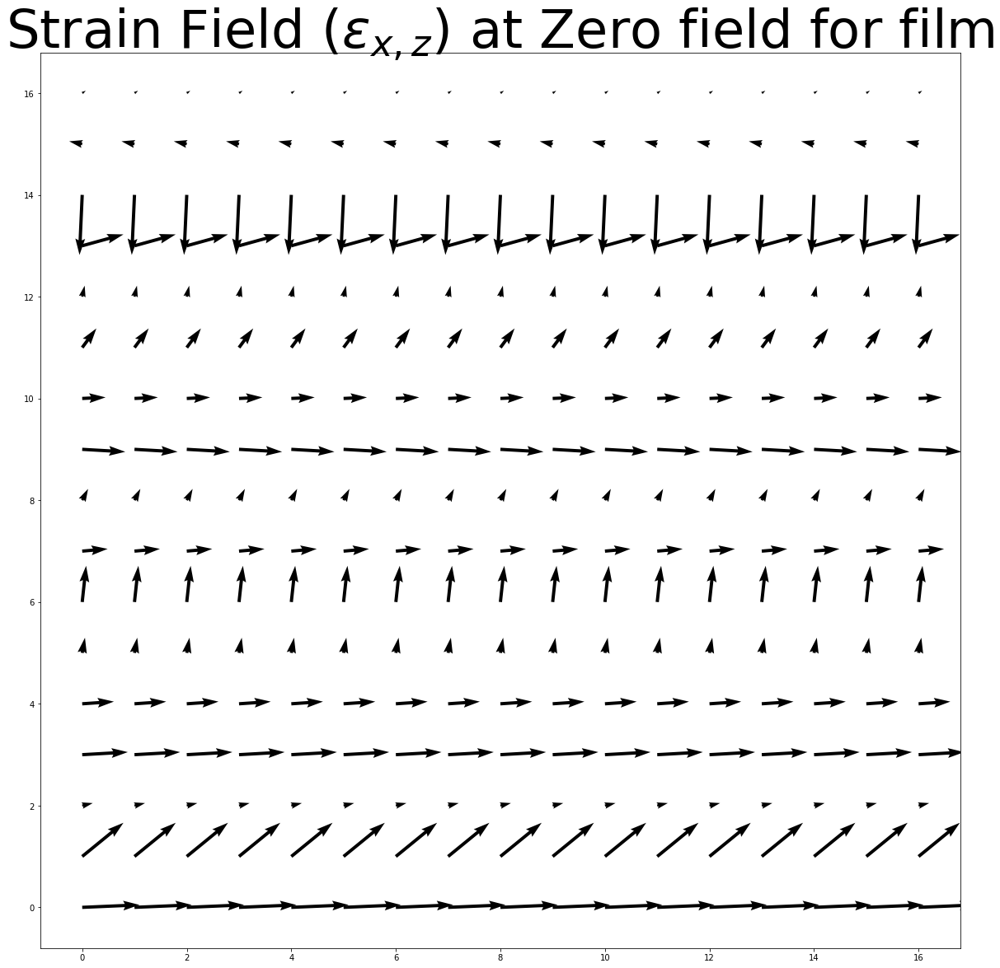

In [159]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

#V = np.array(results[0][50])
V = results[0][54]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

'''
fx=[]

for x,i in enumerate(V):
    fx.append(x[0][10*i])

# vectors y coordinate values
fy=tuple([x[1] for x in V])
'''

fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
    
X, Y = np.meshgrid(x, y)
Q = plt.quiver(X, Y, fx, fy)
#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""
plt.title("Strain Field ($\epsilon_{x,z}$) at Zero field for film",size=64)

#plt.savefig("figsarticle/strain_field_etheta_ez_struct_magn_marten.jpg")
plt.savefig("strainfield_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("/home/vagner/Documents/PosDoc/Dante/Congresso/Encontrao2019/poster/figura1/strainfield_film_Mxz_eixox.jpg")


plt.show()





# Mag Field along "z=0" and "z=h/2" 

In [180]:

# the first
V = results[0][51]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])


fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
# the second
V = results2[0][51]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])


fx2=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx2.append(xx[0][0])
fy2=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy2.append(xx[1][0])

fz2=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz2.append(xx[2][0])

# the third
V = results3[0][51]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])


fx3=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx3.append(xx[0][0])
fy3=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy3.append(xx[1][0])

fz3=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz3.append(xx[2][0])

    

    

## At h=0

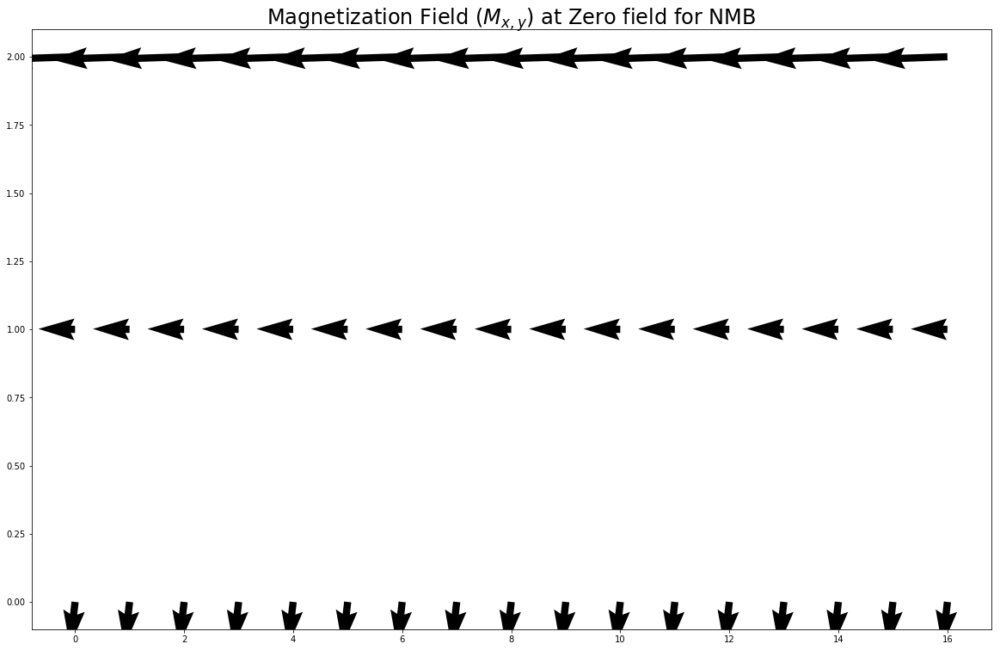

In [229]:
ftotalx_0=fx[:int(sqrt(len(V)))]+fx2[:int(sqrt(len(V)))]+fx3[:int(sqrt(len(V)))]
ftotaly_0=fy[:int(sqrt(len(V)))]+fy2[:int(sqrt(len(V)))]+fy3[:int(sqrt(len(V)))]
ftotalz_0=fz[:int(sqrt(len(V)))]+fz2[:int(sqrt(len(V)))]+fz3[:int(sqrt(len(V)))]


import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

#V = np.array(results[0][50])

x = np.arange(0, int(sqrt(len(V))))
#y = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, 3)

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

    
    
X, Y = np.meshgrid(x, y)
Q = plt.quiver(X, Y, ftotalx_0, ftotalz_0)
#plt.gca().set_aspect('equal', adjustable='box')
plt.gca().set_aspect(aspect=5.0)
#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""
plt.title("Magnetization Field ($M_{x,y}$) at Zero field for NMB",size=24)

#plt.savefig("figsarticle/strain_field_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("strainfield_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("/home/vagner/Documents/PosDoc/Dante/Congresso/Encontrao2019/poster/figura2/magfield_nmb_h0_Mxy_eixox.jpg")


plt.show()








## At h/2

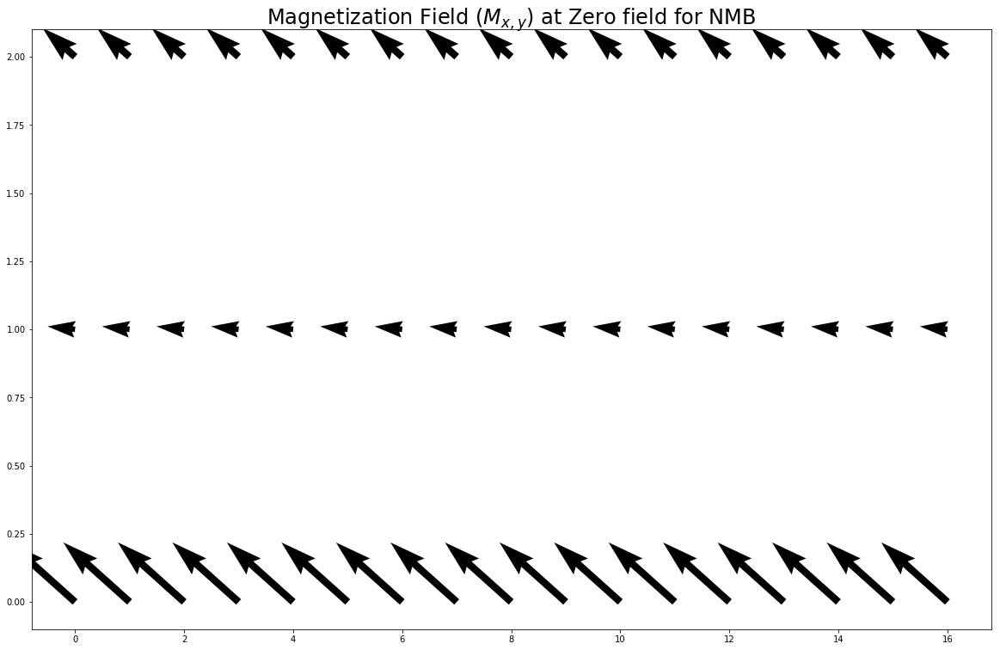

In [225]:


ftotalx_0=fx[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fx2[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fx3[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]

ftotaly_0=fy[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fy2[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fy3[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]
ftotalz_0=fz[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fz2[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]+fz3[int(sqrt(len(V)))*int((sqrt(len(V)))/2.0-1):int(sqrt(len(V)))*int((sqrt(len(V)))/2.0)]


import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))

#V = np.array(results[0][50])

x = np.arange(0, int(sqrt(len(V))))
#y = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, 3.0,1.0)

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

    
    
X, Y = np.meshgrid(x, y)
Q = plt.quiver(X, Y, ftotalx_0, ftotalz_0)
#plt.gca().set_aspect('equal', adjustable='box')
plt.gca().set_aspect(aspect=5.0)
#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""
plt.title("Magnetization Field ($M_{x,y}$) at Zero field for NMB",size=24)

#plt.savefig("figsarticle/strain_field_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("strainfield_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("/home/vagner/Documents/PosDoc/Dante/Congresso/Encontrao2019/poster/figura2/magfield_nmb_hpor2_Mxy_eixox.jpg")


plt.show()








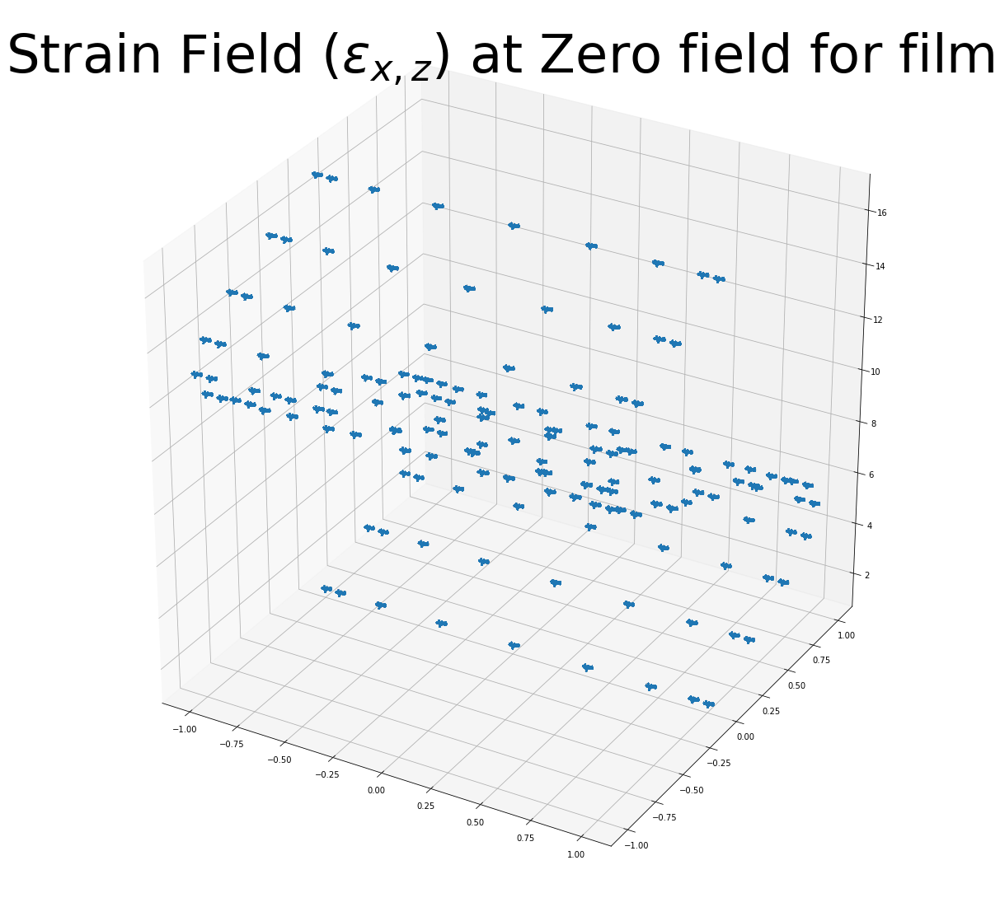

In [282]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(20,20))

#V = np.array(results[0][50])
V = results[0][54]
"""
x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))
z = np.arange(1, 2)
"""

x = np.cos(np.linspace(0,2*3.1415, int(sqrt(len(V)))))
y = np.sin(np.linspace(0,2*3.1415, int(sqrt(len(V)))))
z = np.arange(1, 2)


# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

'''
fx=[]

for x,i in enumerate(V):
    fx.append(x[0][10*i])

# vectors y coordinate values
fy=tuple([x[1] for x in V])
'''

fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
    
X, Y, Z = np.meshgrid(x, y, z)
#len(Z)
for i in range(len(Z)):
    Z[i]=i+1
ax = fig.gca(projection='3d')
#ax.set_aspect("equal")
ax.quiver(X, Y, Z, fx, fy,fz,length=5.5, cmap='Reds', lw=2)
#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""
plt.title("Strain Field ($\epsilon_{x,z}$) at Zero field for film",size=64)

#plt.savefig("figsarticle/strain_field_etheta_ez_struct_magn_marten.jpg")
plt.savefig("strainfield_etheta_ez_struct_magn_marten.jpg")
#plt.savefig("/home/vagner/Documents/PosDoc/Dante/Congresso/Encontrao2019/poster/figura1/strainfield_film_Mxz_eixox.jpg")


plt.show()





In [279]:
x**2+y**2

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [271]:
len(Z)
for i in range(len(Z)):
    Z[i]=i+1

In [275]:
Z[4]

array([[5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5],
       [5]])

In [617]:
V[10]

[[0.1991957851699552, -0.7924249315634672, 0.5765273341370376],
 [-0.9921682314891737, -0.9921695152350215, 0.12179099220339563],
 [-0.9368000000021266, -0.9367916303090661, 0.29962187716598193],
 [-0.7666501818412196, -0.7666734970585327, 0.39867497245263495],
 [-0.1124384392845398, -0.8992380863002823, -0.42276289042235354],
 [-0.9892703962022649, -0.9892681365328839, 0.13772127321376595]]

In [184]:
fx=[]
for i,x in enumerate(V):
    if(i%(ndivr+1)==0):
#        print(x[0][0])
        fx.append(x[0][0])
fy=[]
for i,x in enumerate(V):
    if(i%(ndivt+1)==0):
#        print(x[1][0])
        fy.append(x[1][0])


In [186]:
fy


[0.20965674205482798,
 0.8444215267329519,
 -0.06802611425675342,
 0.6598183357961763,
 0.08906713256481394,
 0.14004221786076418,
 -0.1651932341458805,
 -0.1734583528806664,
 -0.7906712958567026,
 0.4653104750594649]

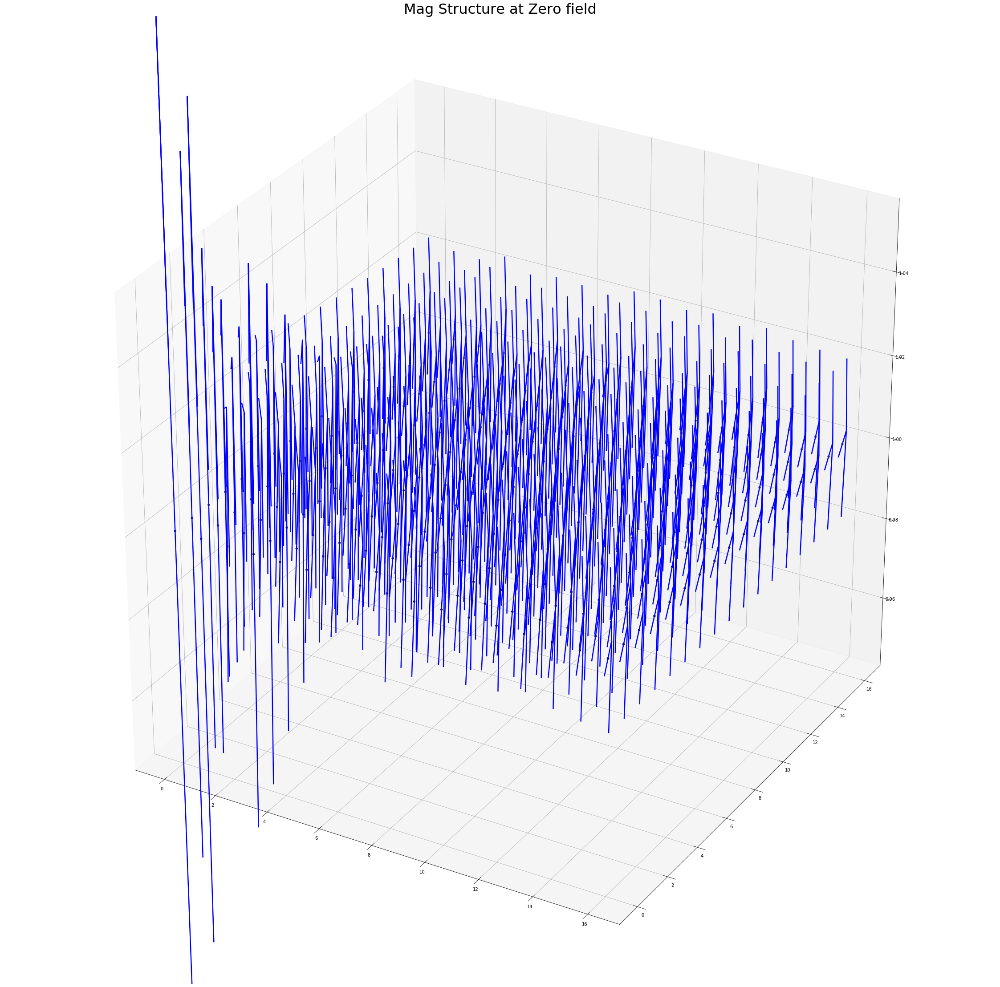

In [335]:

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import numpy as np
import matplotlib.pyplot as plt

#plt.figure(figsize=(20,20))

fig = plt.figure(figsize=(40,40))
ax = fig.gca(projection='3d')


#V = np.array(results[0][50])
V = results[0][52]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))
z = np.array([0 for i in range(int(sqrt(len(V))))])
# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

'''
fx=[]

for x,i in enumerate(V):
    fx.append(x[0][10*i])

# vectors y coordinate values
fy=tuple([x[1] for x in V])
'''

fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
    
X, Y, Z = np.meshgrid(x, y, z)

basegridx=[]
basegridy=[]
basegridz=[]


for i in range(len(V)):
    basegridz.append(1.)

len_comp_sqrt=int(np.sqrt(len(V)))

for i in range(len_comp_sqrt):
    for j in range(len_comp_sqrt):
#        if(i==j==len_comp_sqrt):
#            pass
#        else:
        basegridx.append(i)
        basegridy.append(j)



#ax.quiver(X, Y, Z, fx, fy, fz)
ax.quiver(basegridx,basegridy,basegridz, np.array(fx)+np.array(basegridx), np.array(fy)+np.array(basegridy), np.array(fz)+np.array(basegridz), pivot = 'middle', length = 0.25, normalize = True,edgecolor='b',facecolor='r',linewidth=2.5)
#ax.quiver( basegridx, basegridy,basegridz,np.array(comp_x_reman)+np.array(basegridx),np.array(comp_y_reman)+np.array(basegridy), np.array(comp_z_reman)+np.array(basegridz), length = 0.25, normalize = True,edgecolor='b',facecolor='r',linewidth=2.5)
ax.scatter(basegridx,basegridy,basegridz, color = 'black')


#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""

plt.savefig("struct_magn_marten_2.jpg")
plt.title("Mag Structure at Zero field",size=32)

plt.show()


In [71]:
V

[[[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.8048851040624152],
  [0.4206110298091547, -0.6265704656928022],
  [-0.777731313834554, -0.563250906494439]],
 [[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.8048851040624152],
  [0.4206110298091547, -0.6265704656928022],
  [-0.777731313834554, -0.563250906494439]],
 [[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.8048851040624152],
  [0.4206110298091547, -0.6265704656928022],
  [-0.777731313834554, -0.563250906494439]],
 [[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.8048851040624152],
  [0.4206110298091547, -0.6265704656928022],
  [-0.777731313834554, -0.563250906494439]],
 [[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.8048851040624152],
  [0.4206110298091547, -0.6265704656928022],
  [-0.777731313834554, -0.563250906494439]],
 [[-0.05633329598428669, -0.09523377645441577],
  [-0.5015476007034048, -0.80488

In [308]:
X[1][0]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [297]:
len(X)

17

In [314]:
basegridx=[]
basegridy=[]
basegridz=[]


for i in range(len(V)):
    basegridz.append(1.)

len_comp_sqrt=int(np.sqrt(len(V)))

for i in range(len_comp_sqrt):
    for j in range(len_comp_sqrt):
        if(i==j==len_comp_sqrt):
            pass
        else:
            basegridy.append(j+1)
            basegridx.append(i+1)


In [315]:
len(basegridx)

289

In [318]:
basegridx

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 12,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 14,
 14,
 14,
 14,
 14,
 14,
 14,
 14,
 14,
 14

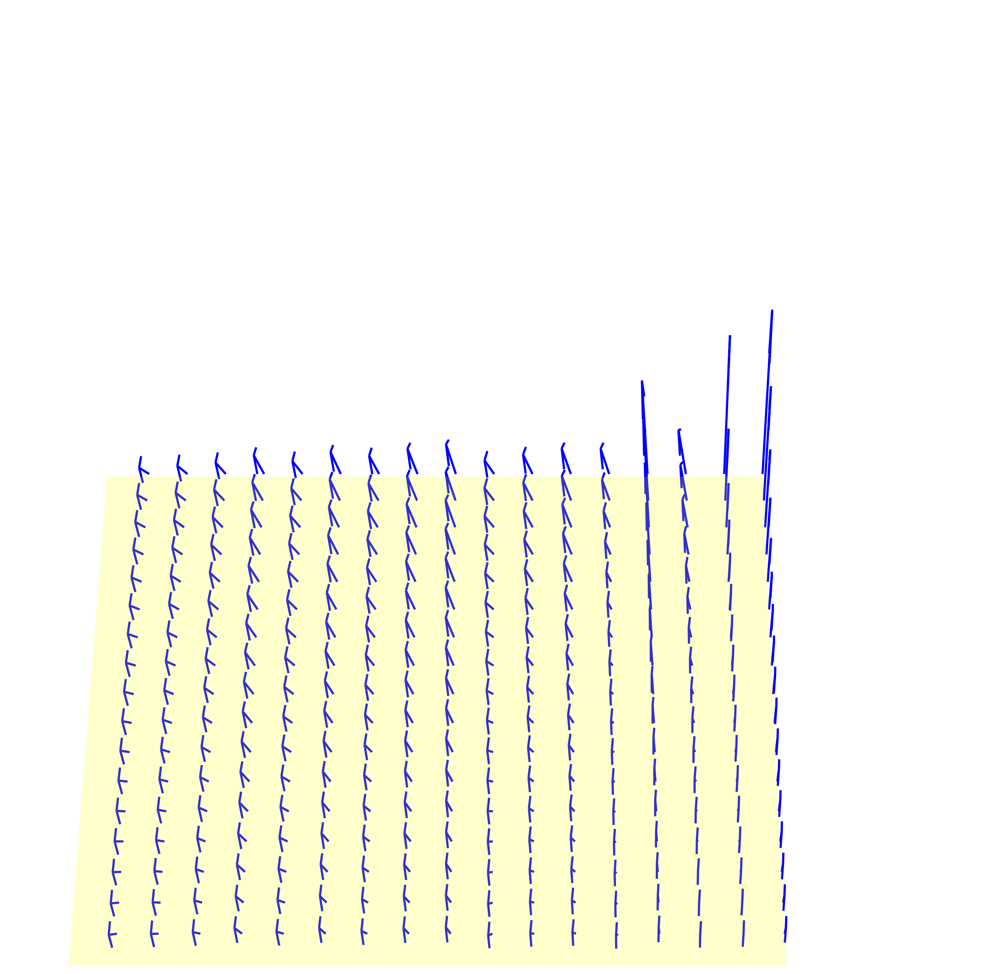

In [355]:
#plt.figure(figsize=(20,20),dpi=100)

"""
for i in range(len(basegrid)):
    for j in range(len(basegrid)):
        for k in range(len(basegrid)):
"""            

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
fig = plt.figure(figsize=(20,20),dpi=200)
ax = fig.gca(projection='3d')
#ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")

#x = [0, 10, 0, 10,0, 10, 0, 10]
#y = [0, 0, 10, 10,0, 0, 10, 10]
#z = [0.9, 0.9, 0.9, 0.9,1.2,1.2,1.2,1.2]

size_t=17

x = [0, size_t,size_t]
y = [0, 0,size_t]
x1 = [0, 0,size_t,0.1,size_t+0.1,size_t+0.1]
y1 = [0, size_t,size_t,0.1, 0.1,size_t+0.1]
z = [1.0,1.0,1.0,1,1,1]
verts = [list(zip(x, y, z))]
verts1 = [list(zip(x1, y1, z))]
#print(verts)
coll=Poly3DCollection(verts1,alpha=0.2)
face_color = [1.0, 1.0, 0] # alternative: matplotlib.colors.rgb2hex([0.5, 0.5, 1])
coll.set_facecolor(face_color)
ax.add_collection3d(coll, zs='z')
#ax.add_collection3d(Poly3DCollection(verts,facecolors='g',alpha=.5), zs='z')
"""
coll=Poly3DCollection(verts1,alpha=1)
face_color = [0.0, 0.5, 0] # alternative: matplotlib.colors.rgb2hex([0.5, 0.5, 1])
coll.set_facecolor(face_color)
ax.add_collection3d(coll, zs='z')
"""

basegridx=[]
basegridy=[]
basegridz=[]


for i in range(len(V)):
    basegridz.append(1.)

len_comp_sqrt=int(np.sqrt(len(V)))

for i in range(len_comp_sqrt):
    for j in range(len_comp_sqrt):
#        if(i==j==len_comp_sqrt):
#            pass
#        else:
        basegridx.append(i)
        basegridy.append(j)

comp_x_reman=fx
comp_y_reman=fy
comp_z_reman=fz

ax.set_xlim3d(-0, 13)
ax.set_ylim3d(-0, 13)
ax.set_zlim3d(1, 1.5)
#ax.grid(False)
# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

#ax.quiver(xgrid[:2], ygrid[:2], zgrid[:2], (xgrid+xv)[:2], (ygrid+yv)[:2], (zgrid+zv)[:2], length = 0.5, normalize = False)
#ax.quiver([0,1], [0,0], [0,0], [0,2], [1,1], [1,0], length = 0.5, normalize = False)
ax.quiver( basegridx, basegridy,basegridz,np.array(comp_x_reman)+np.array(basegridx),np.array(comp_y_reman)+np.array(basegridy), np.array(comp_z_reman)+np.array(basegridz), length = 0.25, normalize = True,edgecolor='b',facecolor='r',linewidth=2.5)
ax.axis('off')
ax.view_init(elev=45,azim=450)


plt.savefig('figfilm.png')

plt.show()

In [357]:
fz

[0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 0.3393269379176454,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.21752863002957828,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.3245660923653579,
 -0.324566

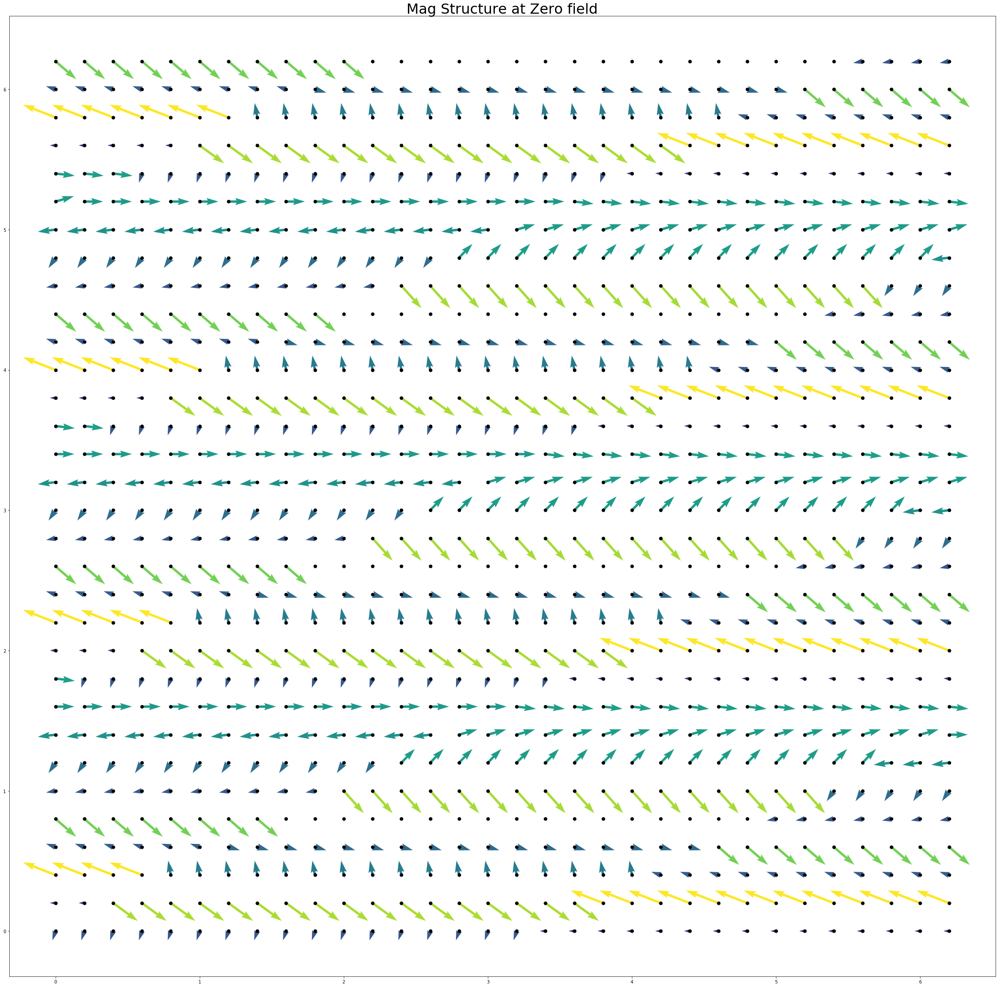

In [396]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(40,40))

#V = np.array(results[0][50])
V = results[0][51]

x = np.arange(0, int(sqrt(len(V))))
y = np.arange(0, int(sqrt(len(V))))

# vectors x coordinate values
#fx = (0, 1, 1, 2)
#fx=tuple([x[0] for x in V])

'''
fx=[]

for x,i in enumerate(V):
    fx.append(x[0][10*i])

# vectors y coordinate values
fy=tuple([x[1] for x in V])
'''

fx=[]
for i,xx in enumerate(V):
#    if(i%(ndivr+1)==0):
#        print(x[0][0])
    fx.append(xx[0][0])
fy=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fy.append(xx[1][0])

fz=[]
for i,xx in enumerate(V):
#    if(i%(ndivt+1)==0):
#        print(x[1][0])
    fz.append(xx[2][0])

    
'''    
X, Y = np.meshgrid(x, y)
Q=plt.quiver(X, Y, fy, fz)
plt.quiverkey(Q, 0.9, 0.9, 1, r'$1 \frac{m}{s}$', labelpos='E',
                   coordinates='figure')

'''
M = np.hypot(fx, fz)

Q = plt.quiver(X, Y, fx, fz, M, units='x')
qk = plt.quiverkey(Q, 0.9, 0.9, 1, r'$1 \frac{m}{s}$', labelpos='E',
                   coordinates='figure')
plt.scatter(X, Y, color='black', s=50)


#plt.xlim(-1, 40)
#plt.ylim(-1, 40)
"""


fig, ax = plt.subplots()
q = ax.quiver(X, Y, fx, fy)
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

"""

plt.savefig("struct_magn_marten_2.jpg")
plt.title("Mag Structure at Zero field",size=32)

plt.show()


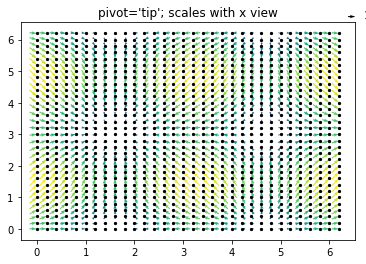

In [382]:
X, Y = np.meshgrid(np.arange(0, 2 * np.pi, .2), np.arange(0, 2 * np.pi, .2))
U = np.cos(X)
V = np.sin(Y)

fig3, ax3 = plt.subplots()
ax3.set_title("pivot='tip'; scales with x view")
M = np.hypot(U, V)
Q = ax3.quiver(X, Y, U, V, M, units='x', pivot='tip', width=0.022,
               scale=1 / 0.15)
qk = ax3.quiverkey(Q, 0.9, 0.9, 1, r'$1 \frac{m}{s}$', labelpos='E',
                   coordinates='figure')
ax3.scatter(X, Y, color='k', s=5)

plt.show()

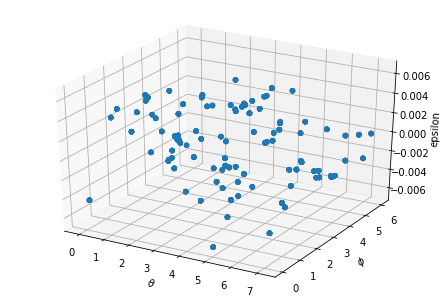

In [27]:

from mpl_toolkits.mplot3d import Axes3D
import random


fig = plt.figure()
ax = Axes3D(fig)


ax.scatter(results[0][34+10],results[0][35+10],results[0][38+10])
ax.set_xlabel(r'$\theta$')
ax.set_ylabel(r'$\phi$')
ax.set_zlabel('epsilon')


plt.show()

In [28]:



# for non-responsive!
# strain x-direction

scale=2


somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][20][300*scale*j+i]
    somahistlist.append(soma)



somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in range(int(len(results[0][10])/300/scale)):
        soma+=results[0][21][300*scale*j+i]
    somahistlist2.append(soma)









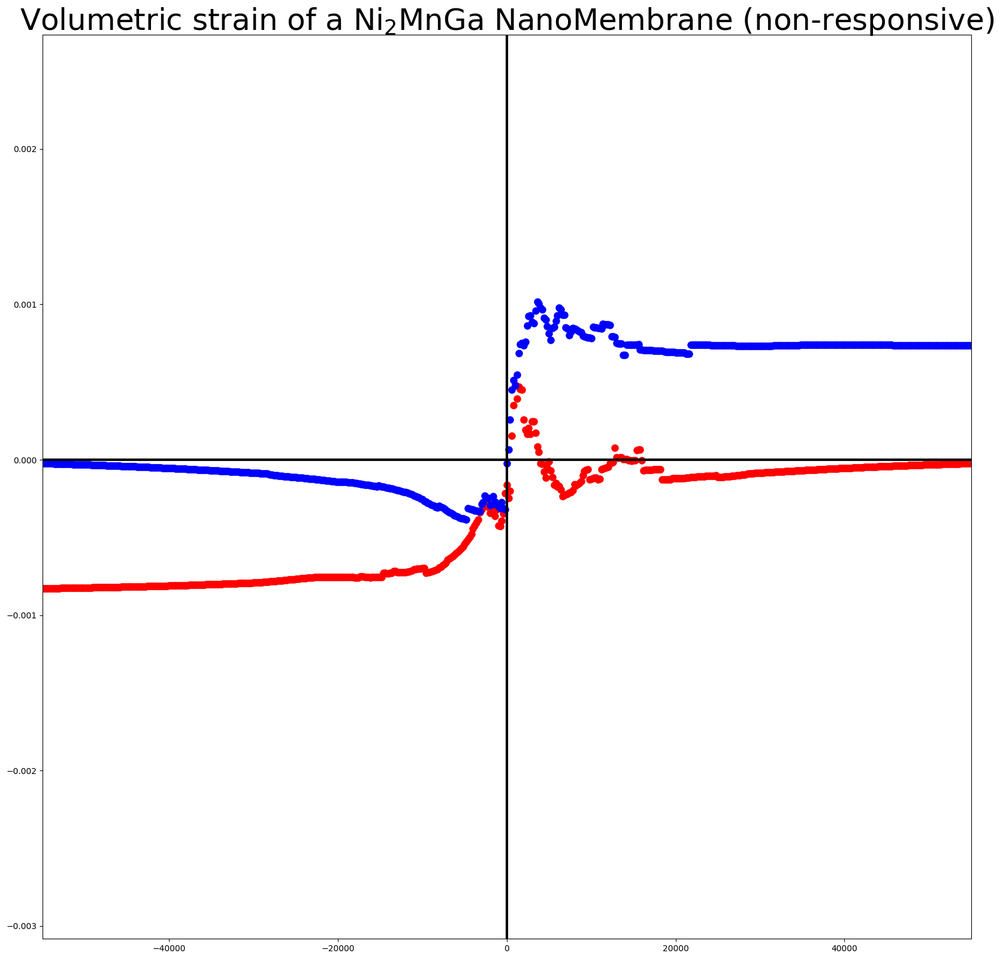

In [29]:






plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist)/10/10,color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist2)/10/10,color="b",label="Negative Branch",linewidth=3.)
plt.title("Volumetric strain of a Ni$_2$MnGa NanoMembrane (non-responsive)",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()












In [172]:

# for magnetostrictivity!

scale=1


indd=10

somahistlist=[]
for i in range(300*scale):
    soma=0
    for j in [indd]:
        soma+=results[0][10][300*scale*j+i]
    somahistlist.append(soma)

somahistlist2=[]
for i in range(300*scale):
    soma=0
    for j in [indd]:
        soma+=results[0][11][300*scale*j+i]
    somahistlist2.append(soma)





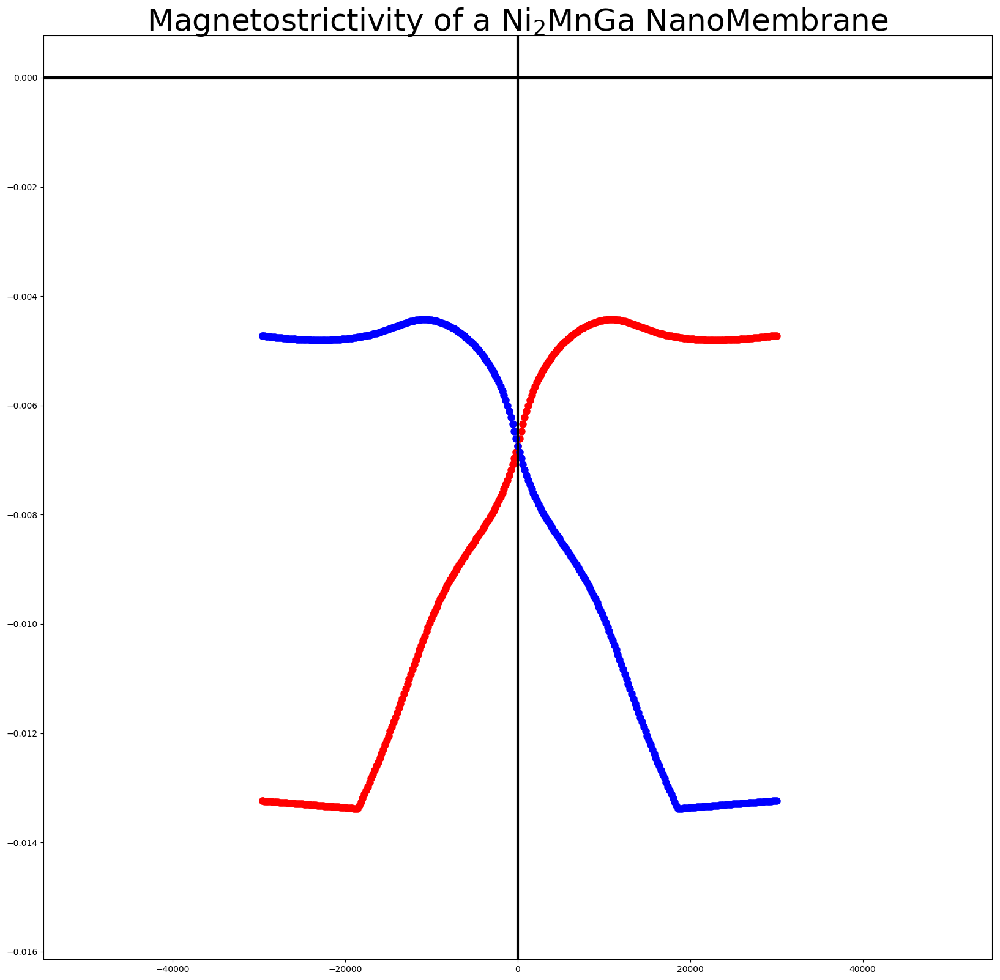

In [173]:

plt.figure(figsize=(20,20),dpi=100)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist),color="r",label="Positive Branch",linewidth=3.)
plt.scatter(results[0][1][0:300*scale]+np.array(0*200),np.array(somahistlist2),color="b",label="Negative Branch",linewidth=3.)
plt.title("Magnetostrictivity of a Ni$_2$MnGa NanoMembrane",size=36)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist)/100*0.975,color="r",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(np.array(results[0][1][0:300])+np.array(0*200),-np.array(somahistlist2)/100*0.975,color="b",label="Simulation",linewidth=3.)
#plt.scatter(-np.array(results[0][1][0:300])+np.array(0*200),-np.array(results[0][9][0:300])/1,color="g",label="Simulation",linewidth=3.)
#plt.scatter(hexp,mexp,label="Experimental Data",linewidth=3.,marker='*',s=100)
plt.axvline(0,0,color="black",linewidth=3.)
plt.axhline(0,0,color="black",linewidth=3.)
plt.xlim(-55000,55000)
#plt.ylim(-1.1,1.1)

plt.show()




In [30]:
#path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_perptubeaxis_h.dat'
path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_alongtubeaxis_h.dat'

hexp10ktube = open(path,'r')
hexp=hexp10ktube.readlines()

print(hexp[0])
#print(a1[0][1])

hexp10ktube.close()

hexp = [float(i) for i in hexp]


#path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_perptubeaxis_m.dat'
path = '/home/vagner/Desktop/RolledupNanomembranes/python3/data_tube_10K_alongtubeaxis_m.dat'
mexp10ktube = open(path,'r')
mexp=mexp10ktube.readlines()

print(mexp[0])
#print(a1[0][1])

mexp10ktube.close()

mexp = [float(i)*1.00 for i in mexp]


39999.67969

0.99183



In [ ]:
float(mexp[0])
random.random()

In [ ]:
stepplot=(hfinal-hini)/10

plt.figure(figsize=(20,20),dpi=100)

#plt.scatter(hlistfinal,maglistfinalcorrected,color="r",label="negative branch",linewidth=3.)
plt.scatter(results[0][1][:399],maglistfinalcorrected,color="r",label="negative branch",linewidth=3.)
#plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
#plt.axis([hini,hfinal,-1.1,1.1])
plt.xticks([hini+stepplot*k for k in range(0,11)],fontsize=25)
plt.yticks([-1.0+0.25*k for k in range(0,11)],fontsize=25)
plt.title(" Magnetic Hysteresis \n 3D Stoner FSMA HALF NMB \n In Plane Intermediate",fontsize=40)
plt.xlabel("Applied Field (Oe)",fontsize=40)
plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
plt.legend(fontsize=30)

plt.savefig("firsthystinpython_half_nmb_inplaneinter_randaxis_testkkkkkkkkkkk.jpg")

plt.show()


In [ ]:

maglistfinalcorrected[201:401]


In [ ]:
results[0][1]

In [ ]:
hpasso/Msat+lambda_mf

In [ ]:
ac

In [ ]:
ac[1,1]=2

In [ ]:
ac

In [ ]:

### Performing the energy evolution with magnetic field





In [ ]:

elasener_finalcorrected=[]




for i in range(len(results[0][0])):

    soma=0

    for j in range(len(results)):
        soma+=results[j][4][i]
        
    elasener_finalcorrected.append((soma)/len(results))

stepplot=(hfinal-hini)/10

plt.figure(figsize=(20,20),dpi=100)

plt.scatter(hlistfinal,elasener_finalcorrected,color="r",label="positive branch",linewidth=3.)
#plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
#plt.axis([hini,hfinal,-1.1,1.1])
plt.xticks([hini+stepplot*k for k in range(0,11)],fontsize=25)
plt.yticks(fontsize=25)
plt.title(" Magnetic Hysteresis 3D Model FSMA \n Elastic Energy Evolution  \n Along Tube Axis",fontsize=40)
plt.xlabel("Applied Field (Oe)",fontsize=40)
plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
plt.legend(fontsize=30)

plt.savefig("elasener_alongtubeaxisinplane_10k.jpg")

plt.show()





In [29]:


zeeener_finalcorrected=[]




for i in range(len(results[0][0])):

    soma=0

    for j in range(len(results)):
        soma+=results[j][5][i]
        
    zeeener_finalcorrected.append((soma)/len(results))

stepplot=(hfinal-hini)/10

plt.figure(figsize=(20,20),dpi=100)

plt.scatter(hlistfinal,zeeener_finalcorrected,color="r",label="positive branch",linewidth=3.)
#plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
#plt.axis([hini,hfinal,-1.1,1.1])
plt.xticks([hini+stepplot*k for k in range(0,11)],fontsize=25)
plt.yticks(fontsize=25)
plt.title(" Magnetic Hysteresis 3D Model FSMA \n Zeeman Energy Evolution  \n Along Tube Axis",fontsize=40)
plt.xlabel("Applied Field (Oe)",fontsize=40)
plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
plt.legend(fontsize=30)

plt.savefig("zeeener_alongtubeaxisinplane_10k.jpg")

plt.show()








IndexError: list index out of range

In [ ]:

print(len(results[0][1][300:600]))
print(len(results[i][6][300:601]))
#print(results[1])

In [ ]:
results[9][6]

stepplot=(hfinal-hini)/5

plt.figure(figsize=(80,80))
for i in range(25):
#    plt.figure(figsize=(20,20),dpi=100)
    plt.subplot(5, 5, i+1)

    plt.scatter(results[0][1][300:600],results[i][6][300:600],color="r",label="positive branch",linewidth=3.)
    #plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
    #plt.axis([hini,hfinal,-1.1,1.1])
    plt.xticks([hini+stepplot*k for k in range(0,6)],fontsize=25)
    plt.yticks(fontsize=25)
    plt.title(" Z Comp. Mag  \n Along Tube Axis",fontsize=40)
    plt.xlabel("Applied Field (Oe)",fontsize=40)
    plt.ylabel("Normalized Magnetization",color="b",fontsize=40)
    plt.legend(fontsize=30)

plt.savefig("zcomponent_alongtubeaxisinplane_10k.pdf")

plt.show()


In [ ]:


rem_mag=[]

#for i in range(len(results[0][0])):

soma=0

for j in range(len(results)):
#        soma+=results[j][4][int(len(results[0][0])/2)]
    rem_mag.append(results[j][6][int(len(results[0][0])/2)])
#    elasener_finalcorrected.append((soma)/len(results))

stepplot=(hfinal-hini)/10

zlist = []

for i in range(ndiv):
    zlist.append(-1+2*i/ndiv)

plt.figure(figsize=(20,20),dpi=100)

plt.scatter(zlist,rem_mag,color="r",label="positive branch",linewidth=3.)
plt.scatter(-np.array(zlist),-np.array(rem_mag),color="b",label="negative branch",linewidth=3.)
#plt.scatter(hexp,mexp,color="r",label="negative branch",linewidth=3)
#plt.axis([hini,hfinal,-1.1,1.1])
#plt.xticks([hini+stepplot*k for k in range(0,11)],fontsize=25)
plt.yticks(fontsize=25)
plt.title(" Z Comp. Mag. for Field Along Tube Axis",fontsize=40)
plt.xlabel("Z. Coord of the Tube (from -1 to 1)",fontsize=40)
plt.ylabel("Normalized Z Magnetization",color="b",fontsize=40)
plt.legend(fontsize=30)

plt.savefig("zerofield_alongtubeaxisinplane_10k.jpg")

plt.show()





In [ ]:
rem_mag

In [ ]:
zlist

In [ ]:
results[9][6]